In [1]:
import numpy as np
import matplotlib.pyplot as plt

import scipy.special
from scipy.stats import norm 

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, Matern,ConstantKernel,WhiteKernel
from warnings import filterwarnings
filterwarnings('ignore')

Define the Branin-Hoo function hrer, and also consider noise in our observed data.

In [2]:
#Objective function
def branin_hoo(arg,a=1,b=5.1/(4*(np.pi**2)),c=5/np.pi,r=6,s=10,t=1/(8*np.pi),add_noise=False):
    x1=arg[0]
    x2=arg[1]
    y=a*(x2-b*(x1**2)+c*x1-r)**2+s*(1-t)*np.cos(x1)+s
    if add_noise:
        nu=np.random.randint(-10,10)*1e-2
        y=y+nu
    return y

Define a function to plot the truth function for comparison

In [3]:
def truth_plot(func,space,label='Branin-Hoo($x$)'):
    ub=[]
    lb=[]
    for key in space:
        lb.append(space[key][0])
        ub.append(space[key][1])
    x1=np.linspace(lb[0],ub[0],100)
    x2=np.linspace(lb[1],ub[1],100)
    X1,X2=np.meshgrid(x1,x2)
    Z=func([X1,X2])
    plt.contourf(X1,X2,Z,levels=30,cmap='turbo')
    plt.colorbar(label=label)
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')

Define a function to generate 2-D sample data for Branin-Hoo function

In [4]:
def sample_generator(target_func,space,init_points=5):
    x_min=[]
    x_max=[]
    x_range=[]
    for key in space:
        x_min.append(space[key][0]) #lower bound
        x_max.append(space[key][1]) #upper bound
        x_range.append(space[key][1]-space[key][0]) #range
    X_min=np.array(x_min)
    X_max=np.array(x_max)
    X_range=np.array(x_range)
    x_sample=[]
    for i in range(init_points-2): #number of points to generate(2 are edge points)
        a=np.random.random(len(space)) #random ratio to produce sample points
        xx_sample=[]
        for j in range(len(space)):# length scale
            xx_sample.append(X_min[j]+a[j]*X_range[j])
        x_sample.append(xx_sample)
    x=np.vstack((X_min,X_max,np.array(x_sample)))
    y=target_func(x.T,add_noise=True) #to include noise in observed data
    return x,y

Define the search space and plot the poisition of the sample data in 2-D view.

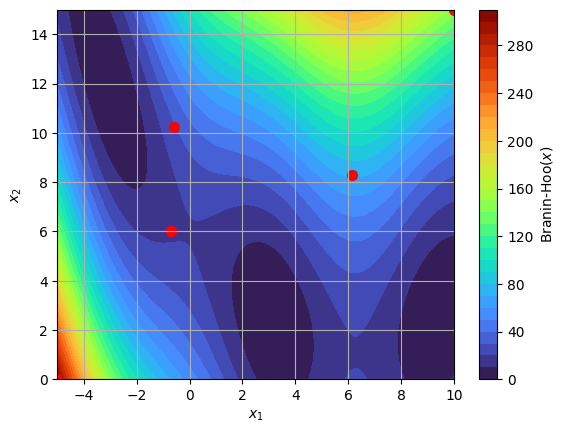

In [5]:
space={'x1':[-5,10],'x2':[0,15]}
truth_plot(branin_hoo,space)
x_sample,y_sample=sample_generator(branin_hoo,space,5)
plt.scatter(x_sample[:,0],x_sample[:,1],s=50,c='r')
plt.grid()

plot the poisition of the sample data in 2-D view

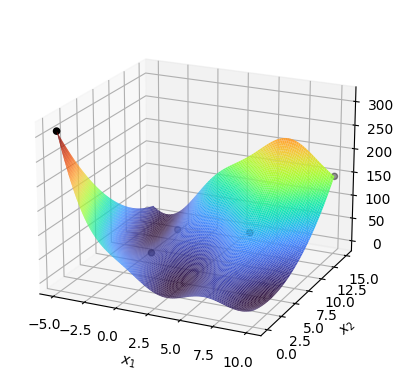

In [6]:
ax = plt.axes(projection='3d')
x1_p=np.linspace(-5,10,100)
x2_p=np.linspace(0,15,100)

X1_p,X2_p=np.meshgrid(x1_p,x2_p)
Z_p=branin_hoo([X1_p,X2_p])
ax.plot_surface(X1_p,X2_p, Z_p, rstride=1, cstride=1, cmap='turbo')
ax.scatter3D(x_sample[:,0],x_sample[:,1],y_sample, color='k')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
#ax.set_zlabel('Branin-Hoo($x$)')
ax.view_init(20, -65)

Function for generating Gaussian Process regressor for iteration.

In [7]:
def rand_gpr(x,y,kernel="Matern"):
    theta=np.random.rand(x.shape[1],)*10
    theta0=np.random.rand(1)*5
    a=ConstantKernel(theta0)
    nu=np.random.randint(-10,10)*1e-4
    if kernel=="Matern":
        k=a**2*Matern(nu=2.5,length_scale=theta,length_scale_bounds=(1e-9,1e5))
        +nu*WhiteKernel(noise_level=1, noise_level_bounds=(1e-5, 1e1))
    elif kernel=="RBF":
        k=a**2*RBF(length_scale=theta,length_scale_bounds=(1e-9,1e5))
        +nu*WhiteKernel(noise_level=1, noise_level_bounds=(1e-5, 1e1))
    return GaussianProcessRegressor(kernel=k,random_state=1000).fit(x,y)


Function to plot the mean function, standard deviation, and acquisition function.

In [8]:
def plot_dist(X1,X2,val,x_sample,x_next,n,cmap='ocean',label='Acquisition($x$)'):
    plt.subplot(2,2,n)
    plt.contourf(X1,X2,val,levels=30,cmap=cmap)
    plt.colorbar(label=label)
    plt.scatter(x_sample[:,0],x_sample[:,1],s=50,c='orange',label='sample')
    plt.scatter(x_next[0],x_next[1],s=50,c='r',marker='s')
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    plt.grid()

Function that take in the regressor list and integrate all the acquisition function, and then return the next point to evaluate. 

In [14]:
def GP_pred(gpr,x_sample,y_sample,space,target_func,acq='EI'):
    def acquisition(x,gpr):
        #x=np.array(x).reshape(1,-1)
        mu,std = gpr.predict(x,return_std=True)
        #print(mu,std)
        best_y=y_sample.min()
        if acq=='EI': #Expected Improvement
            gamma=(best_y-mu)/std
            acq_val =((best_y-mu)*norm.cdf(gamma)+norm.pdf(gamma))
        elif acq=='PI': #Probability Improvement
            gamma=(best_y-mu)/std
            acq_val = norm.cdf(gamma)
        elif acq=='LCB': #confidence bound (Lower for minimization)
            acq_val = -(mu -1.6*std)
        return acq_val,mu,std
    n_gpr=len(gpr)
    ub=[]
    lb=[]
    for key in space:
        lb.append(space[key][0])
        ub.append(space[key][1])
    x1_new=np.linspace(lb[0],ub[0],50)
    x2_new=np.linspace(lb[1],ub[1],50)
    X1_new,X2_new=np.meshgrid(x1_new,x2_new)
    Mean=np.zeros((n_gpr,50,50))
    Std=np.zeros((n_gpr,50,50))
    Acq_val=np.zeros((n_gpr,50,50))
    for k in range(n_gpr):
        gpr[k].fit(x_sample,y_sample)
        for i in range(50):
            for j in range(50):
                point=np.array((x1_new[i],x2_new[j])).reshape(1,-1)
                acq_val,mu,std=acquisition(point,gpr[k])
                #print(acq_val,mu,std)
                Acq_val[k][j][i]=acq_val
                Mean[k][j][i]=mu
                Std[k][j][i]=std
    mean_int=Mean.mean(axis=0)
    std_int=Std.mean(axis=0)
    acq_val_int=Acq_val.mean(axis=0) #integration
    idx=np.where(acq_val_int==acq_val_int.max())
    #print(acq_val_int.max())
    plt.figure()
    if len(idx[0])==1:
        x1_next=x1_new[np.where(acq_val_int==acq_val_int.max())[1]]
        x2_next=x2_new[np.where(acq_val_int==acq_val_int.max())[0]]
    elif len(idx[0])>1:
        x1_next=x1_new[np.where(acq_val_int==acq_val_int.max())[1][0]]
        x2_next=x2_new[np.where(acq_val_int==acq_val_int.max())[0][0]]
    else:
        x_next=x_sample[-1].reshape(1,-1)
        plot_dist(X1_new,X2_new,std_int*2,x_sample,x_next,cmap='summer',label='Standard Deviation')
        plot_dist(X1_new,X2_new,mean_int,x_sample,x_next,cmap='turbo',label='Mean')
        plot_dist(X1_new,X2_new,acq_val_int,x_sample,x_next,cmap='ocean',label='Acquisition($x$)')
        return x_next,acq_val_int
    x_next=np.vstack((x1_next,x2_next)).reshape(1,-1).squeeze()
    plot_dist(X1_new,X2_new,std_int*2,x_sample,x_next,1,cmap='summer',label='Standard Deviation')
    plot_dist(X1_new,X2_new,mean_int,x_sample,x_next,2,cmap='turbo',label='Mean')
    plot_dist(X1_new,X2_new,acq_val_int,x_sample,x_next,3,cmap='ocean',label='Acquisition($x$)')

    plot_dist(X1_new,X2_new,target_func([X1_new,X2_new]),x_sample,x_next,4,cmap='turbo',label='Branin-Hoo($x$)')
    plt.tight_layout()
    plt.show()
    return x_next,acq_val_int

Bayesian optimization iterator function which stores the current best value and return a array after all the iterations are done.

In [15]:
def BayesianOPT(x_sample,y_sample,target_func,space,kernel="Matern",acq="EI",n_gpr=100,n_iter=30):
    gpr=[]
    for i in range(n_gpr):
        gpr.append(rand_gpr(x_sample,y_sample,kernel=kernel))
    f_min=np.zeros(n_iter+1)
    f_min[0]=y_sample.min()
    for i in range(n_iter):
        x_next,Acq_val=GP_pred(gpr,x_sample,y_sample,space,target_func,acq=acq)
        x_sample=np.vstack((x_sample,x_next))
        y_next=target_func(x_next)
        y_sample=np.hstack((y_sample,np.array(y_next)))
        f_min[i+1]=y_sample.min()
        #truth_plot(target_func,space,label='Branin-Hoo($x$)')
        #plt.scatter(x_sample[:,0],x_sample[:,1],s=50,c='orange',label='sample')
        #plt.scatter(x_next[0],x_next[1],s=50,c='r',marker='s')
        #plt.grid()
        #plt.show()
        print('Current best value:' ,y_sample.min())
        print('Next point to test:', x_next)
        print('Value of next point: ', y_next)
    return f_min

Generate 50 regressor, and perform 40 iterations for each method.

This block is the optimization process of Matern52 kernel with probability of improvement.

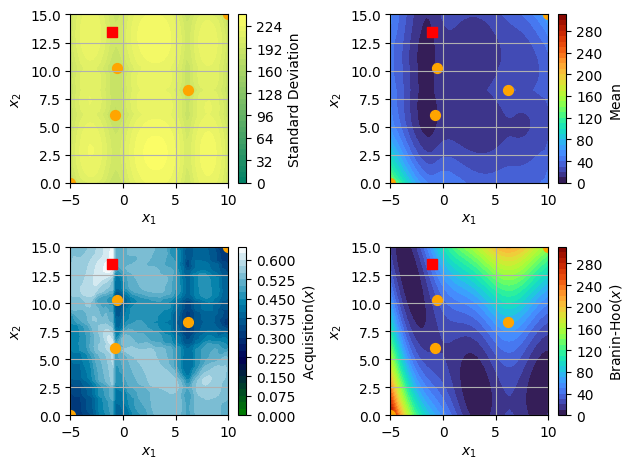

Current best value: 18.538588464818865
Next point to test: [-1.02040816 13.46938776]
Value of next point:  47.63584737002227


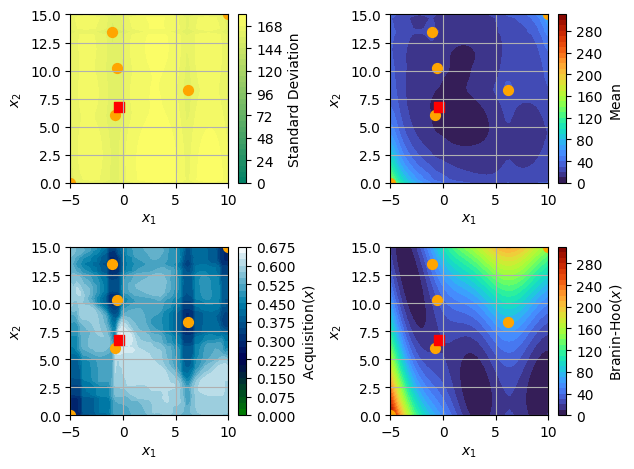

Current best value: 18.538588464818865
Next point to test: [-0.40816327  6.73469388]
Value of next point:  18.817352559480256


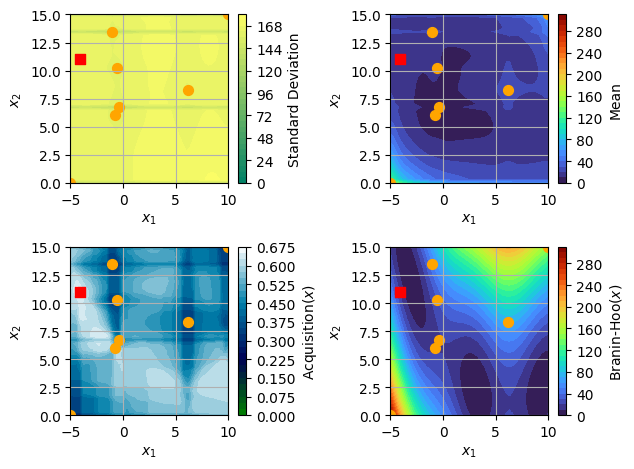

Current best value: 17.498687687726953
Next point to test: [-4.08163265 11.02040816]
Value of next point:  17.498687687726953


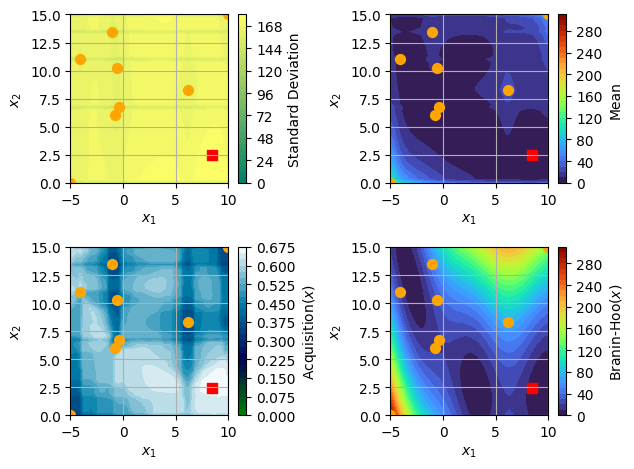

Current best value: 4.89497995311433
Next point to test: [8.46938776 2.44897959]
Value of next point:  4.89497995311433


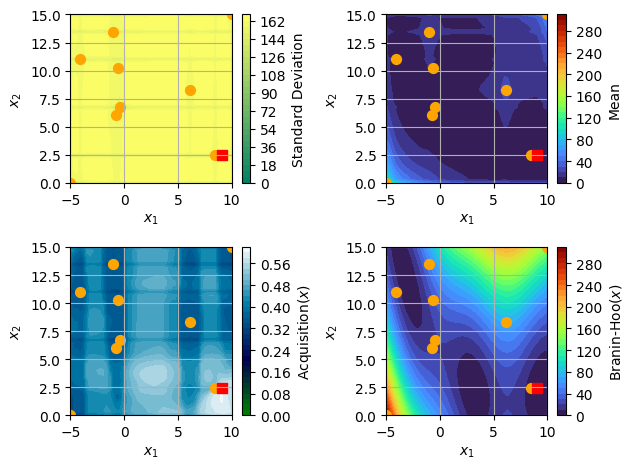

Current best value: 1.0192925976815097
Next point to test: [9.08163265 2.44897959]
Value of next point:  1.0192925976815097


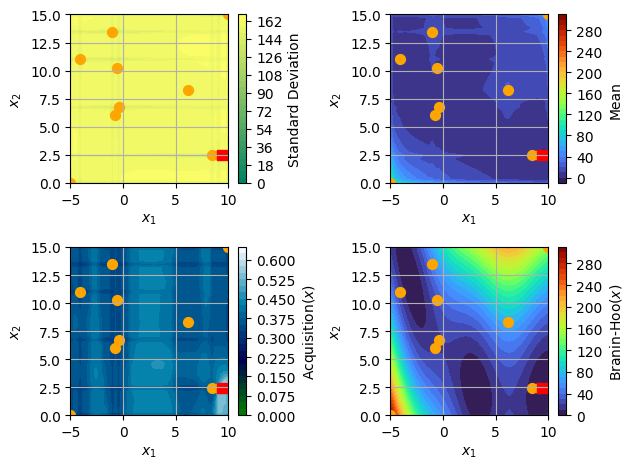

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


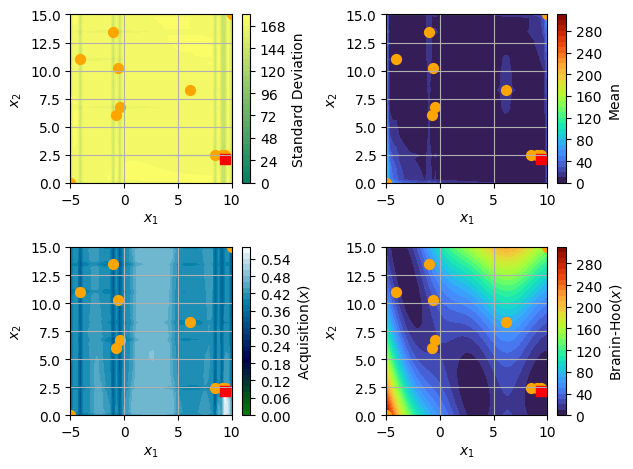

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.14285714]
Value of next point:  0.4951227826887994


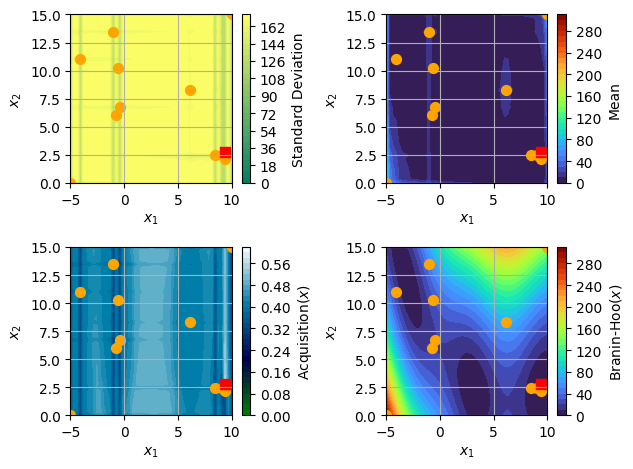

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.75510204]
Value of next point:  0.5012845204240453


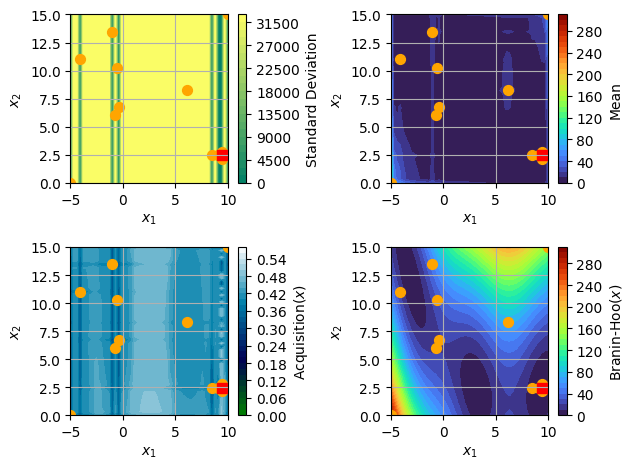

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


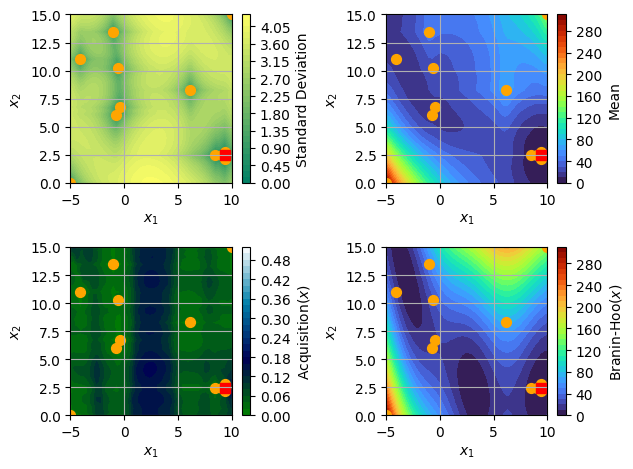

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


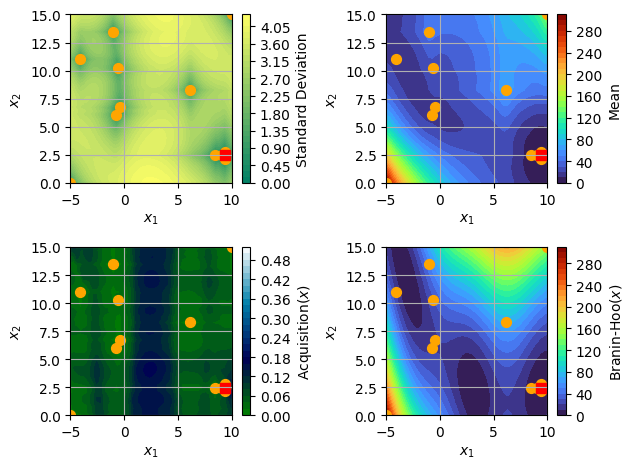

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


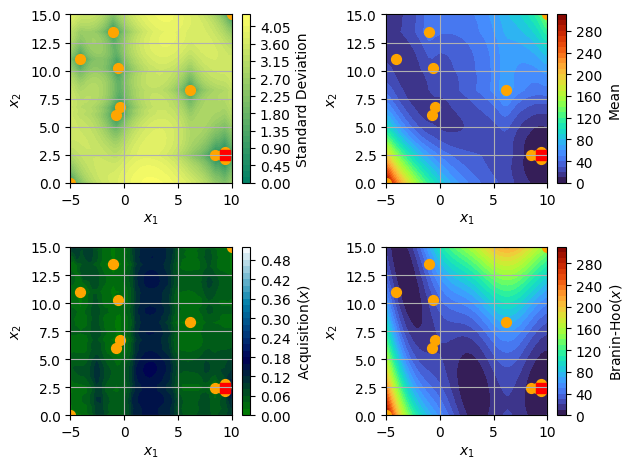

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


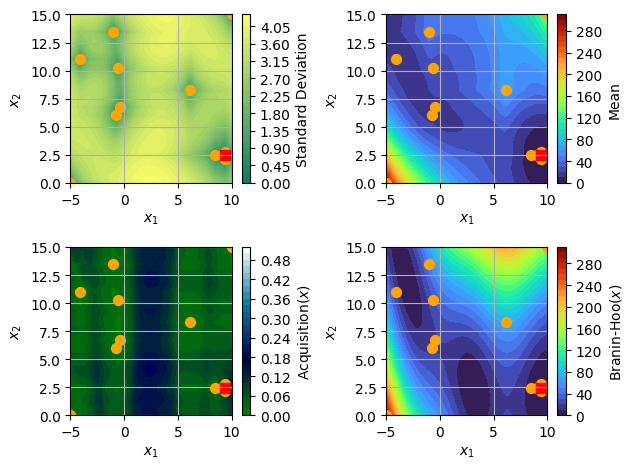

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


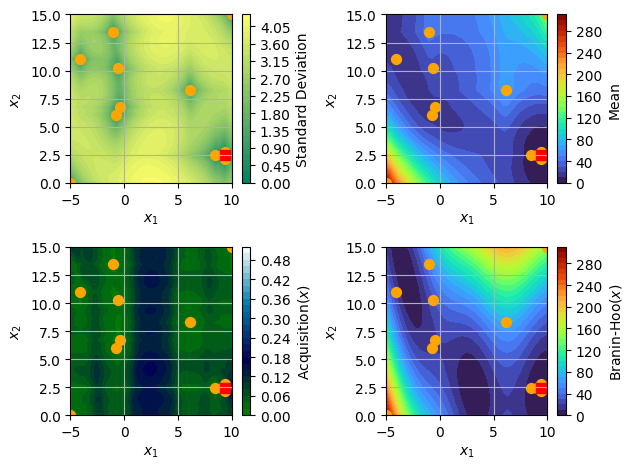

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


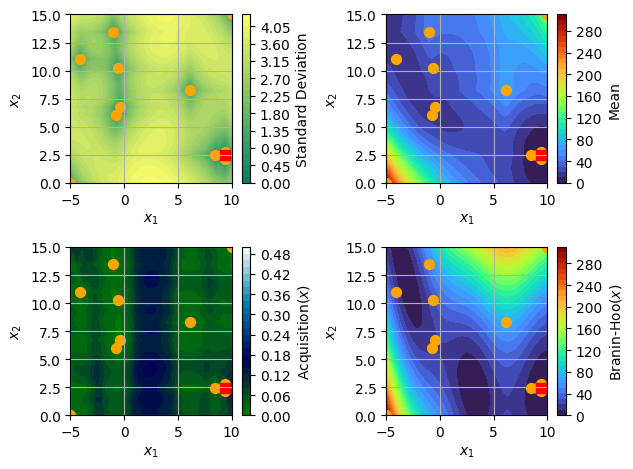

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


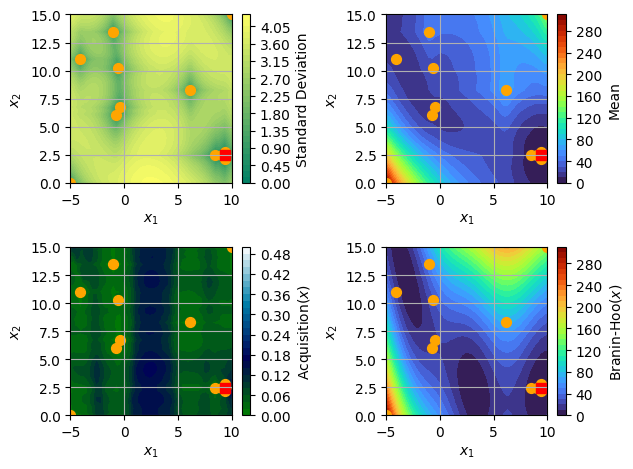

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


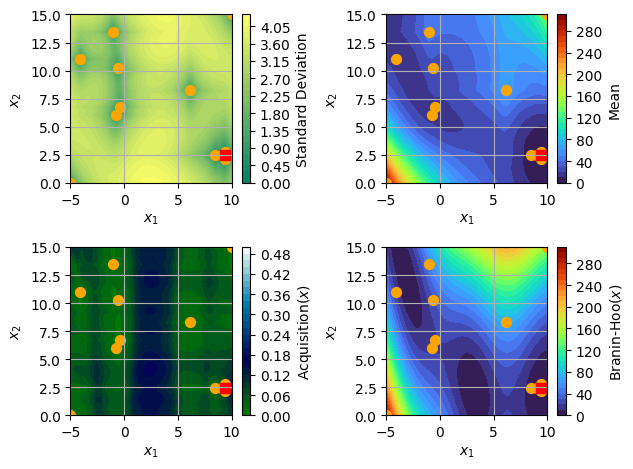

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


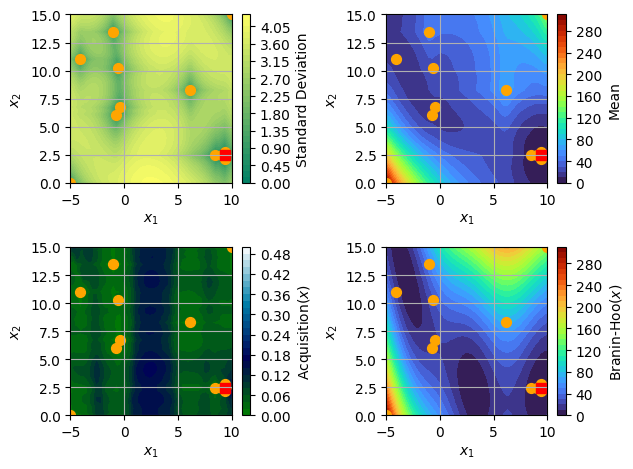

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


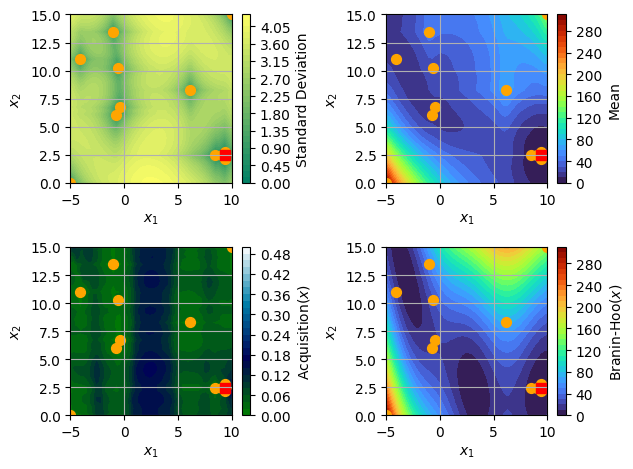

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


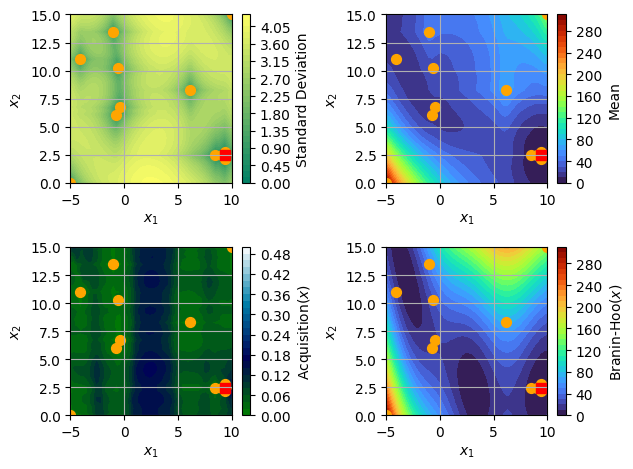

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


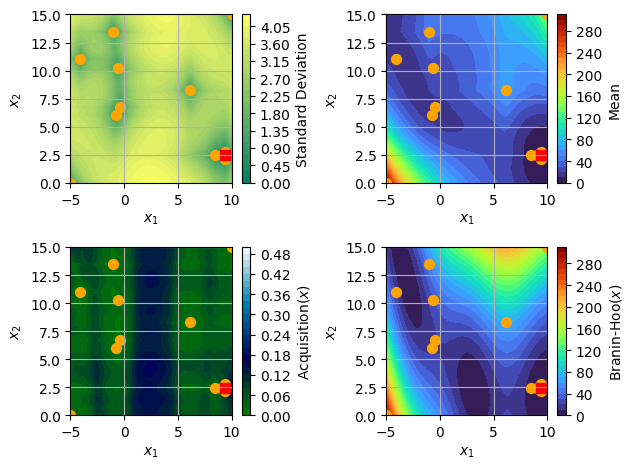

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


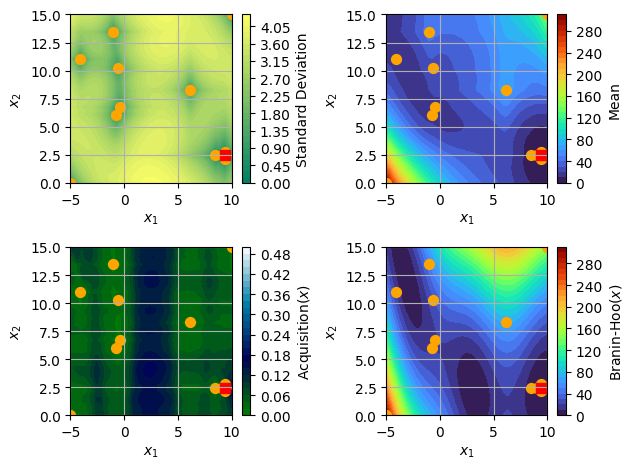

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


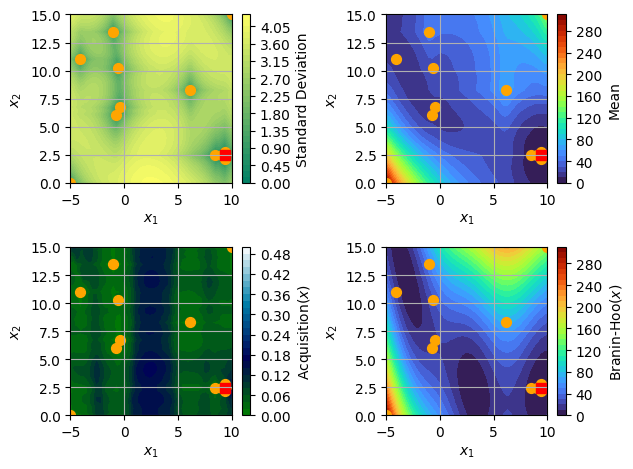

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


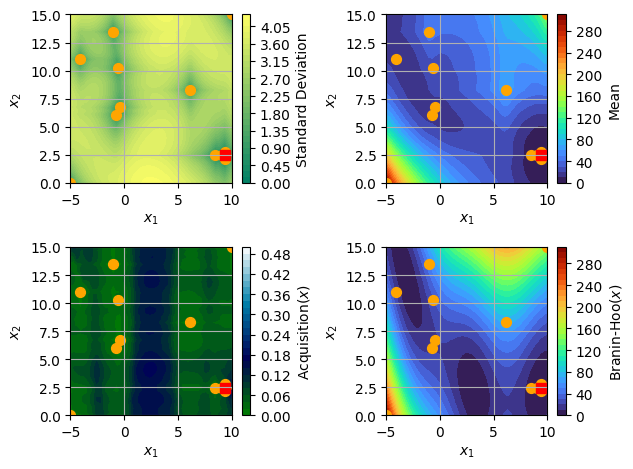

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


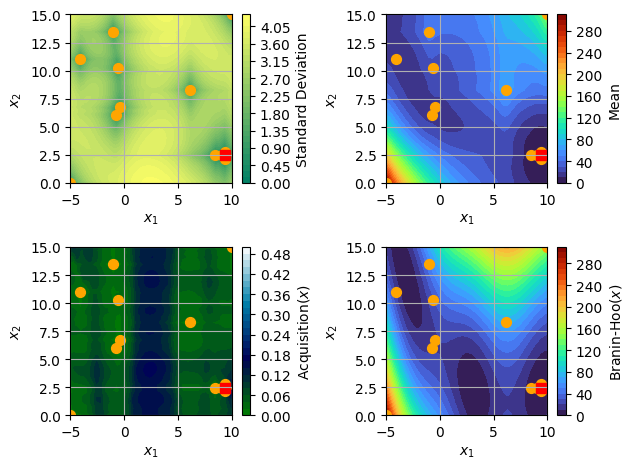

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


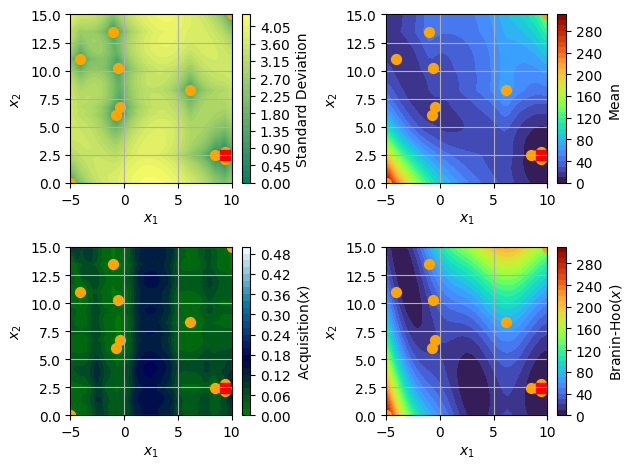

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


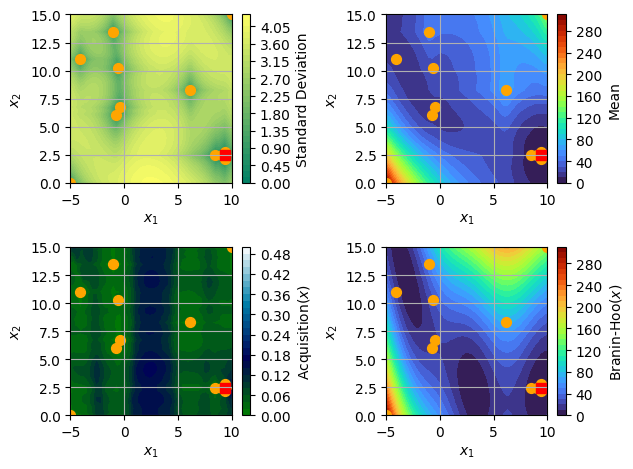

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


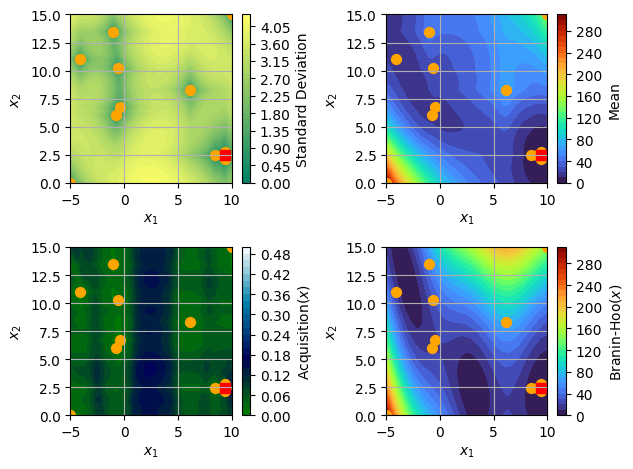

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


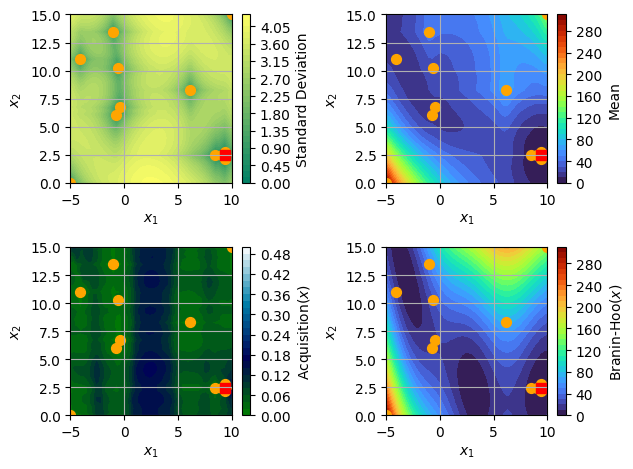

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


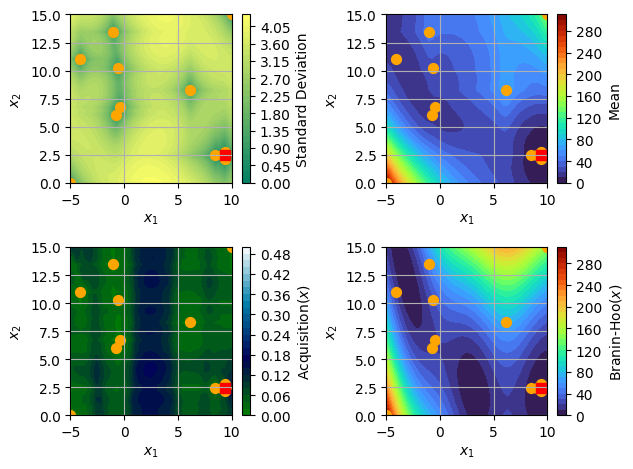

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


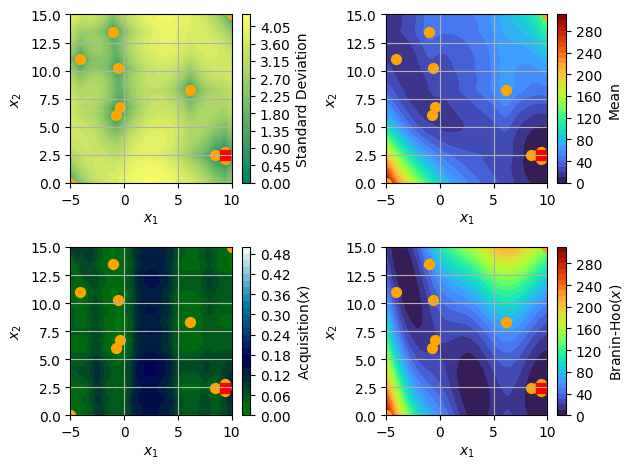

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


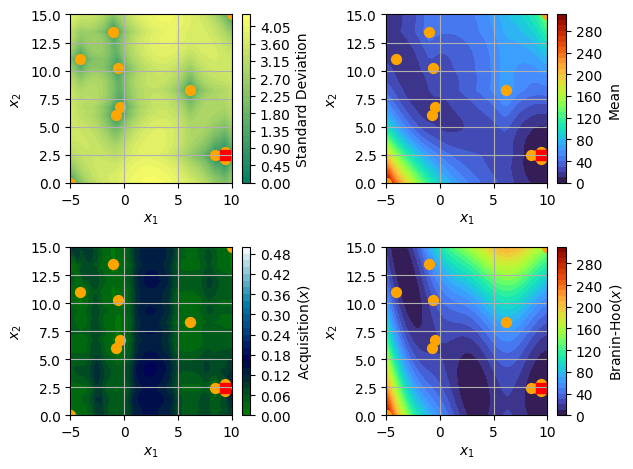

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


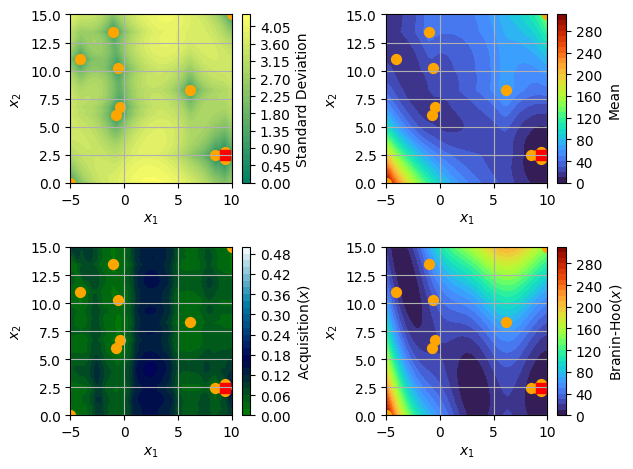

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


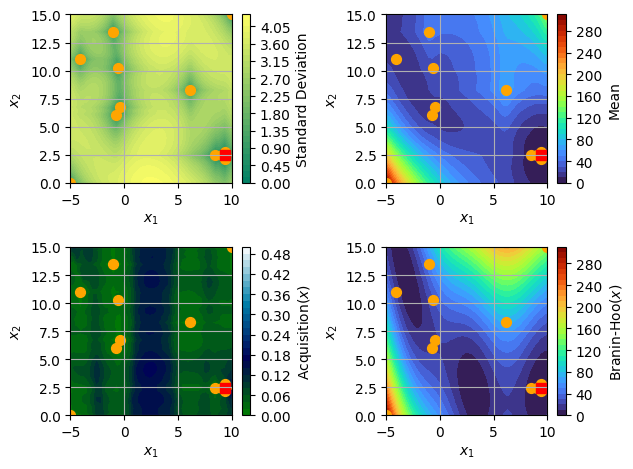

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


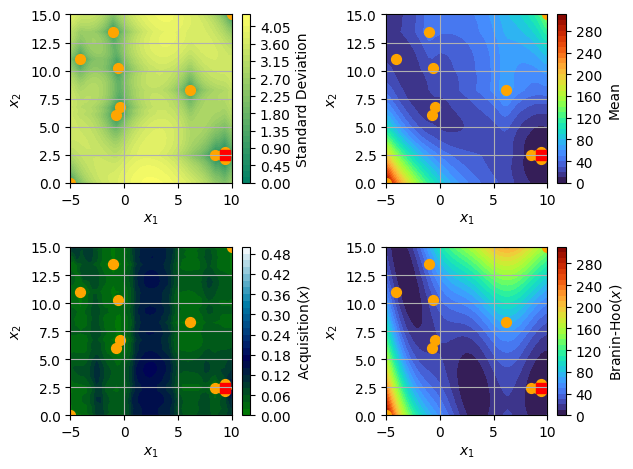

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


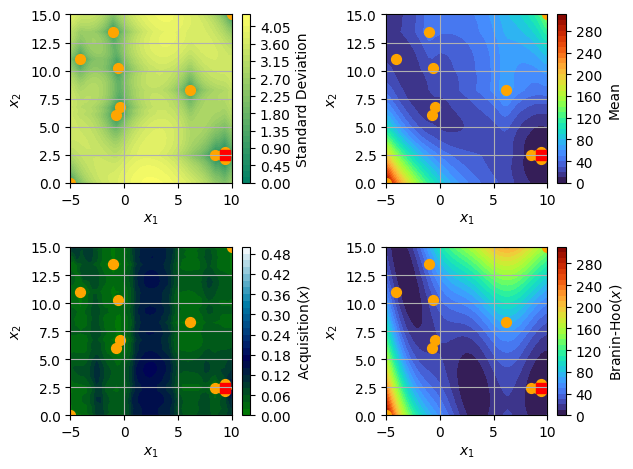

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


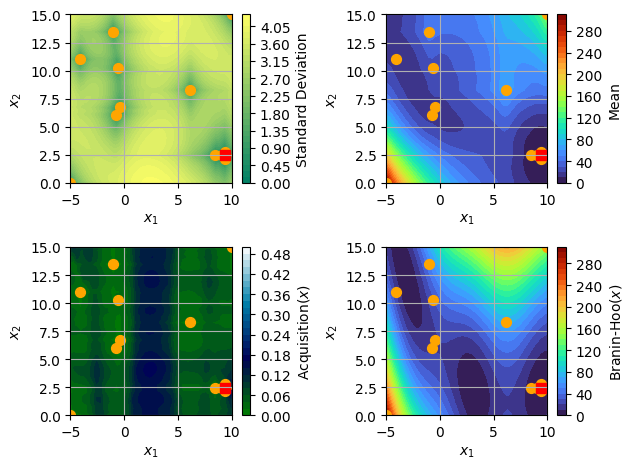

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


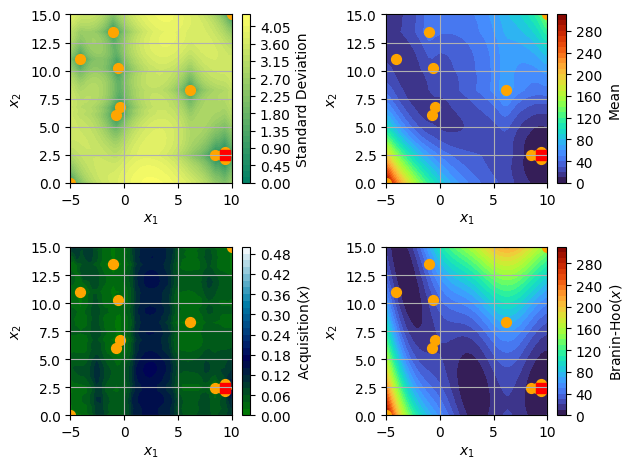

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


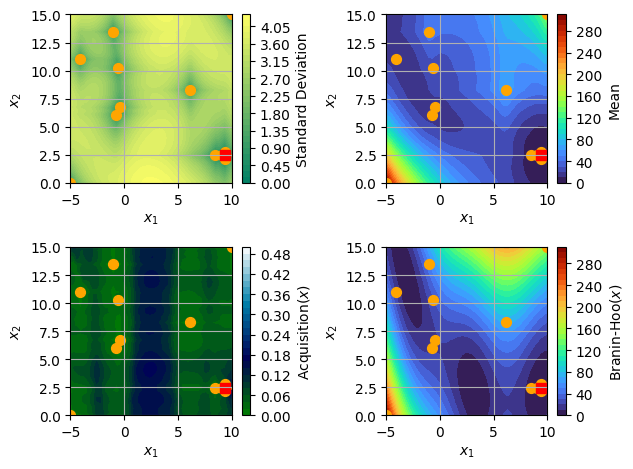

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


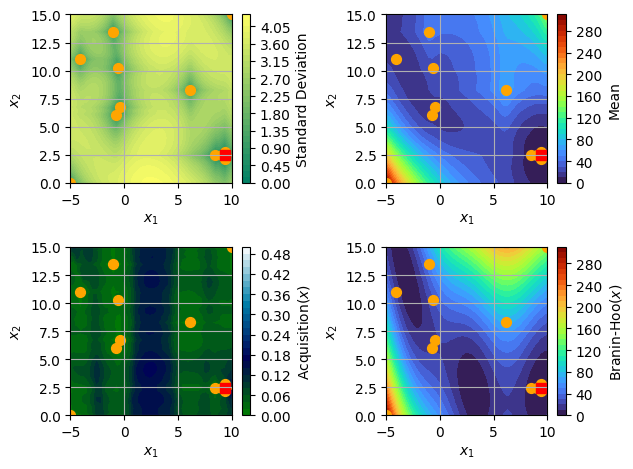

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


In [16]:
n_gpr=50
n_iter=40
fmin_Matern52_PI=BayesianOPT(x_sample,y_sample,branin_hoo,space,kernel="Matern",acq="PI",n_gpr=n_gpr,n_iter=n_iter)

This block is the iteration for Matern52 kernel with expected improvement.

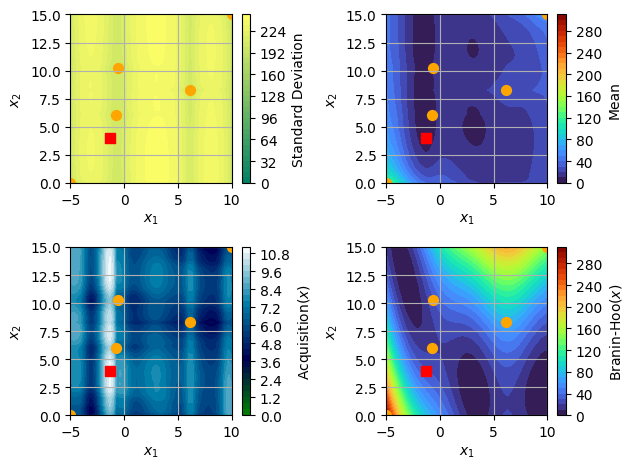

Current best value: 18.538588464818865
Next point to test: [-1.32653061  3.97959184]
Value of next point:  31.32284099223468


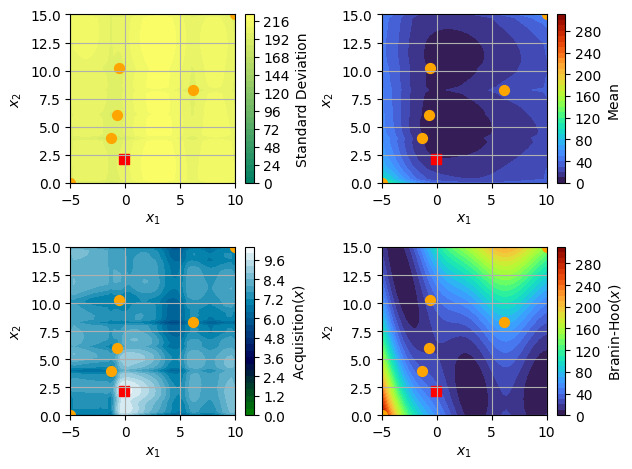

Current best value: 18.538588464818865
Next point to test: [-0.10204082  2.14285714]
Value of next point:  35.71973003642991


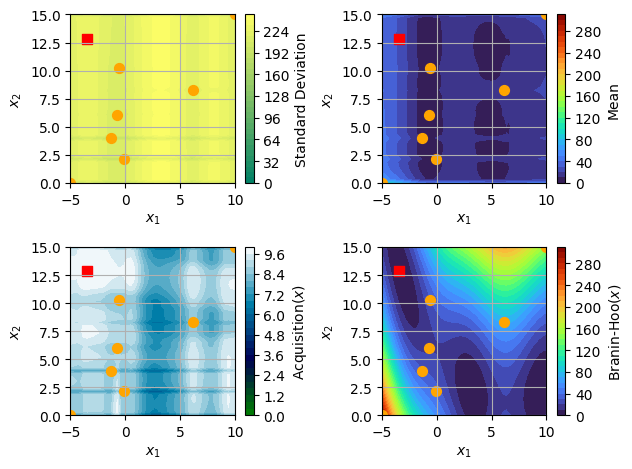

Current best value: 0.9573402323979217
Next point to test: [-3.46938776 12.85714286]
Value of next point:  0.9573402323979217


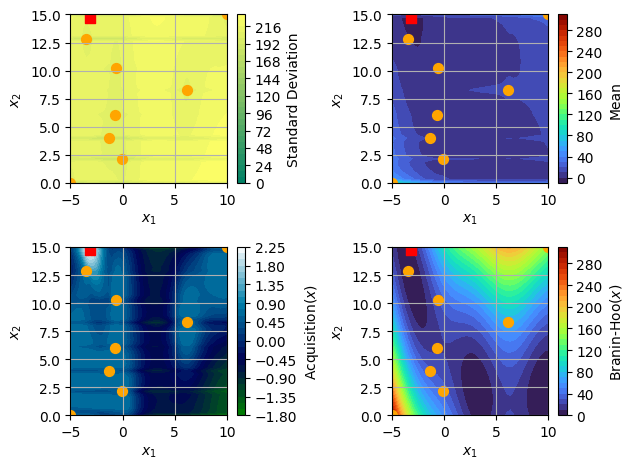

Current best value: 0.9573402323979217
Next point to test: [-3.16326531 14.69387755]
Value of next point:  6.001564099774179


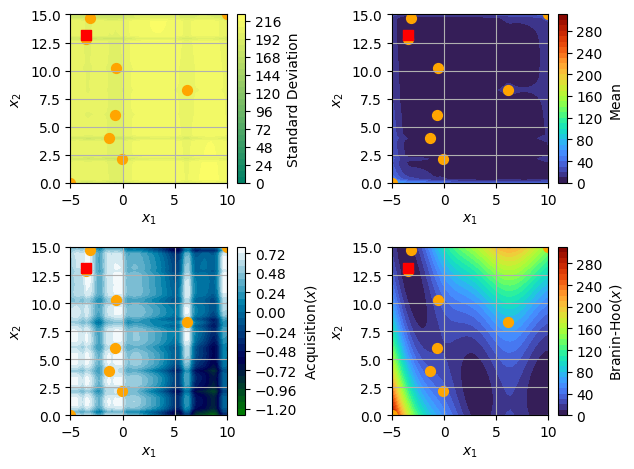

Current best value: 0.9166584398244382
Next point to test: [-3.46938776 13.16326531]
Value of next point:  0.9166584398244382


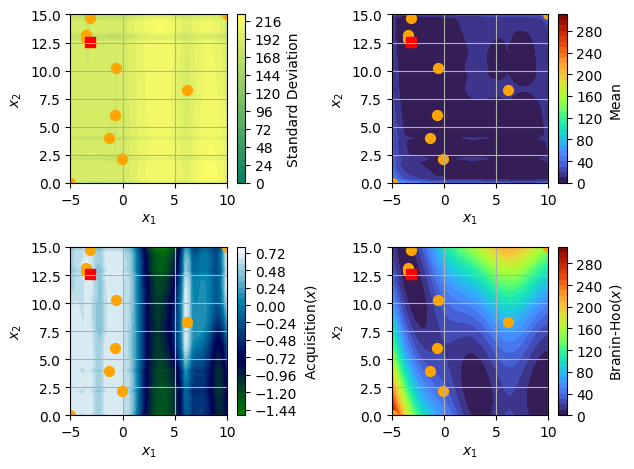

Current best value: 0.45026242787601944
Next point to test: [-3.16326531 12.55102041]
Value of next point:  0.45026242787601944


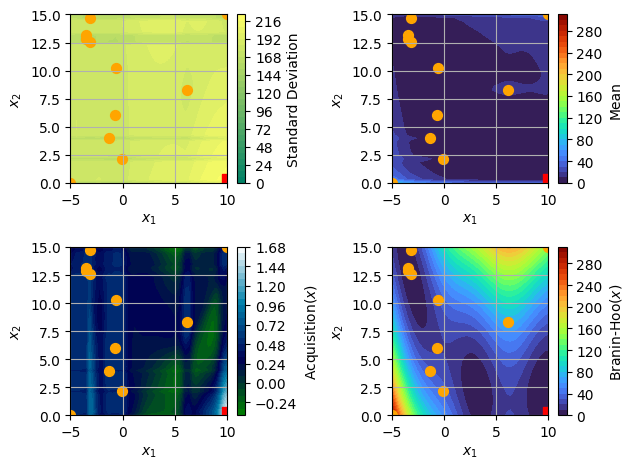

Current best value: 0.45026242787601944
Next point to test: [10.          0.30612245]
Value of next point:  9.216055129089016


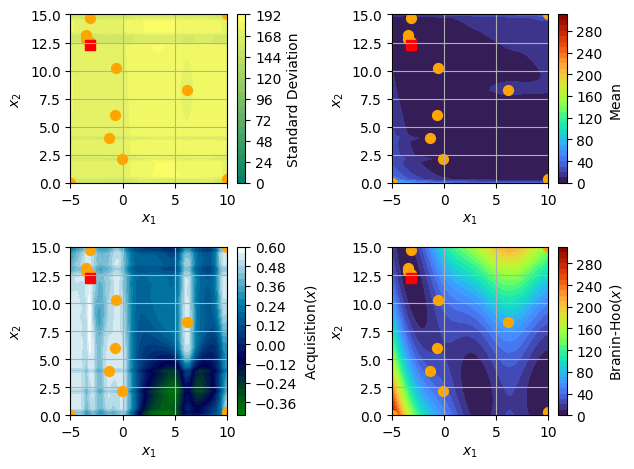

Current best value: 0.4069069620446708
Next point to test: [-3.16326531 12.24489796]
Value of next point:  0.4069069620446708


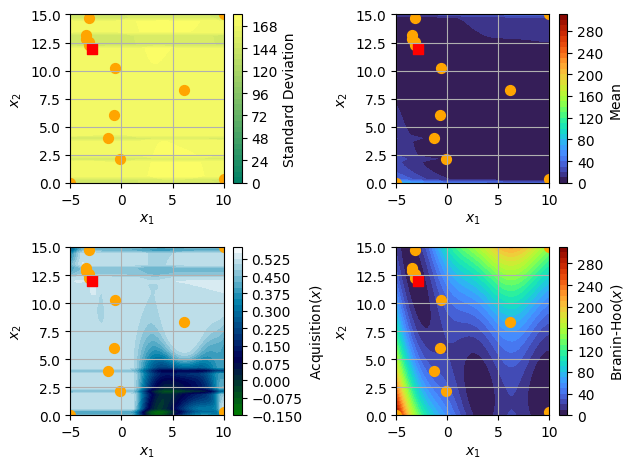

Current best value: 0.4069069620446708
Next point to test: [-2.85714286 11.93877551]
Value of next point:  0.8972545019556613


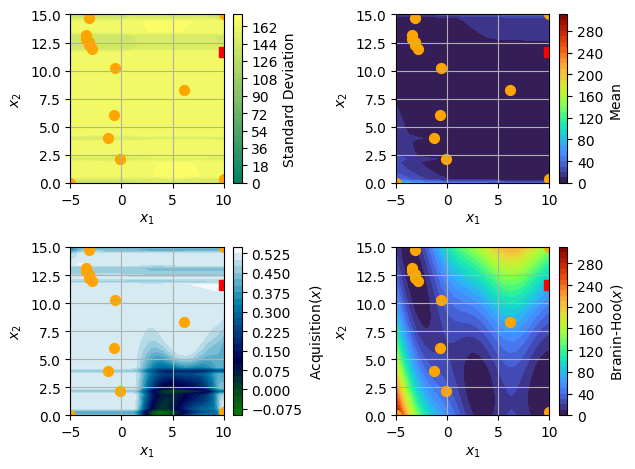

Current best value: 0.4069069620446708
Next point to test: [10.         11.63265306]
Value of next point:  76.41480158586035


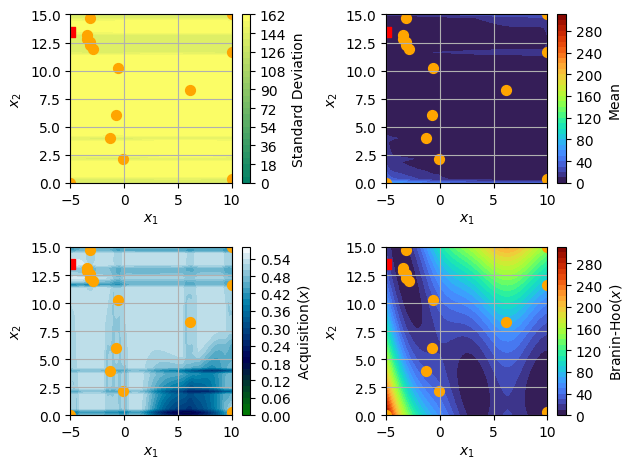

Current best value: 0.4069069620446708
Next point to test: [-5.         13.46938776]
Value of next point:  26.54707300244122


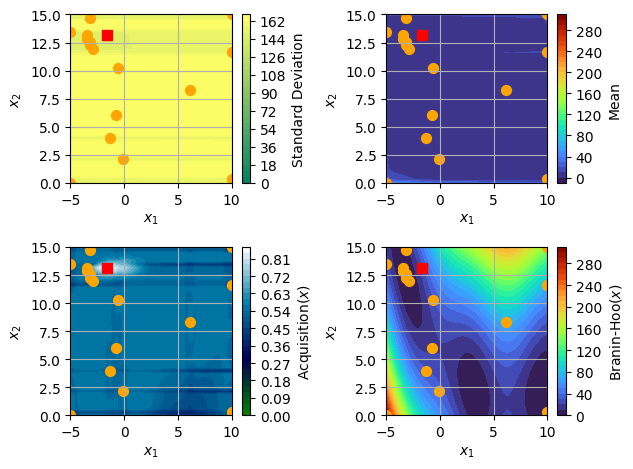

Current best value: 0.4069069620446708
Next point to test: [-1.63265306 13.16326531]
Value of next point:  27.218779497249475


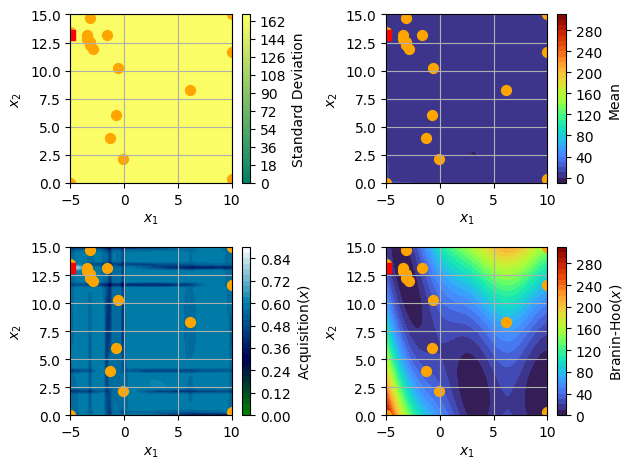

Current best value: 0.4069069620446708
Next point to test: [-5.         13.16326531]
Value of next point:  28.917093422389403


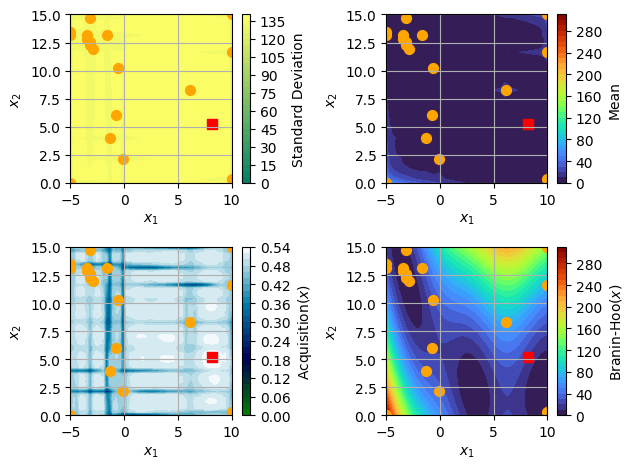

Current best value: 0.4069069620446708
Next point to test: [8.16326531 5.20408163]
Value of next point:  19.948276639862293


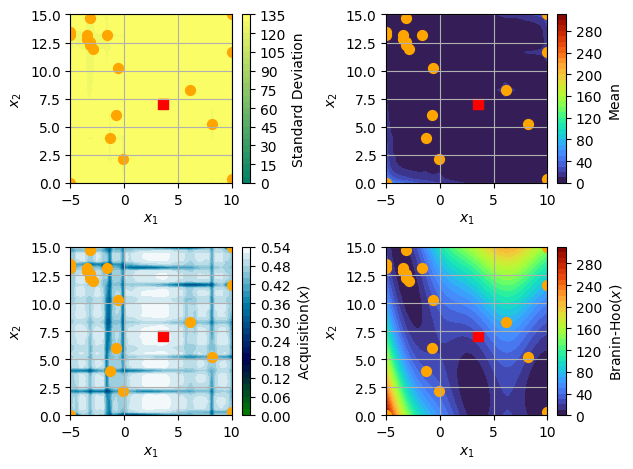

Current best value: 0.4069069620446708
Next point to test: [3.57142857 7.04081633]
Value of next point:  27.048903854780196


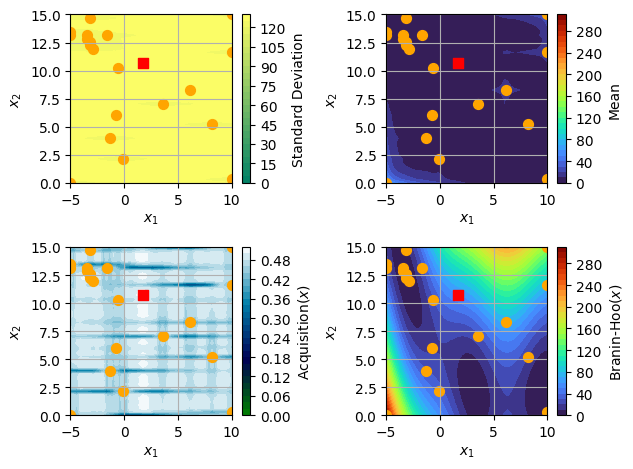

Current best value: 0.4069069620446708
Next point to test: [ 1.73469388 10.71428571]
Value of next point:  58.6503321150745


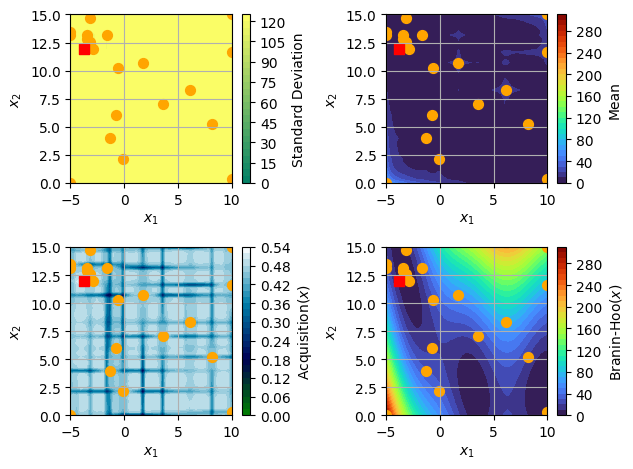

Current best value: 0.4069069620446708
Next point to test: [-3.7755102  11.93877551]
Value of next point:  5.917638836538231


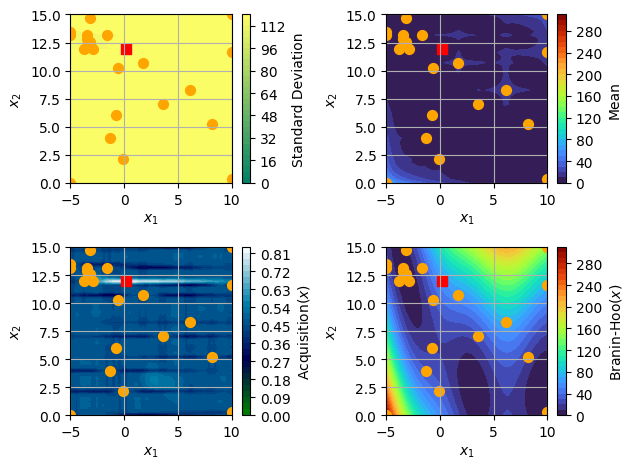

Current best value: 0.4069069620446708
Next point to test: [ 0.20408163 11.93877551]
Value of next point:  58.56792564047531


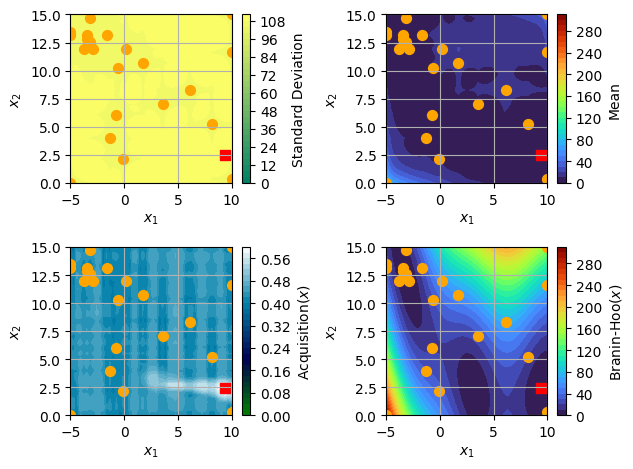

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


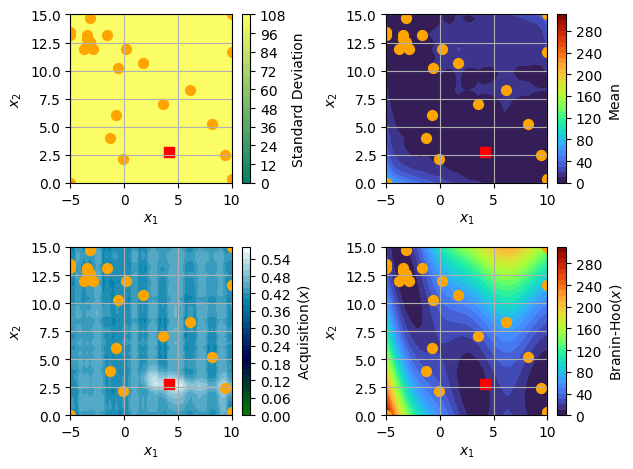

Current best value: 0.404492697787159
Next point to test: [4.18367347 2.75510204]
Value of next point:  6.484697096818312


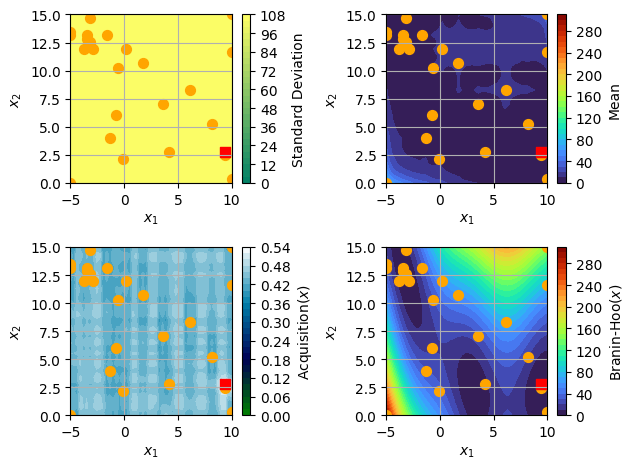

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.75510204]
Value of next point:  0.5012845204240453


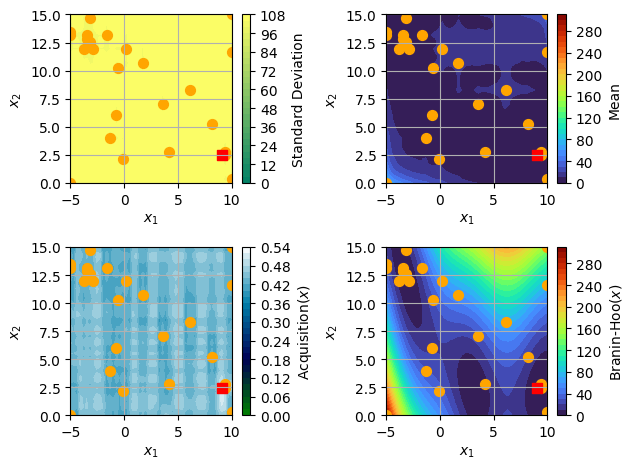

Current best value: 0.404492697787159
Next point to test: [9.08163265 2.44897959]
Value of next point:  1.0192925976815097


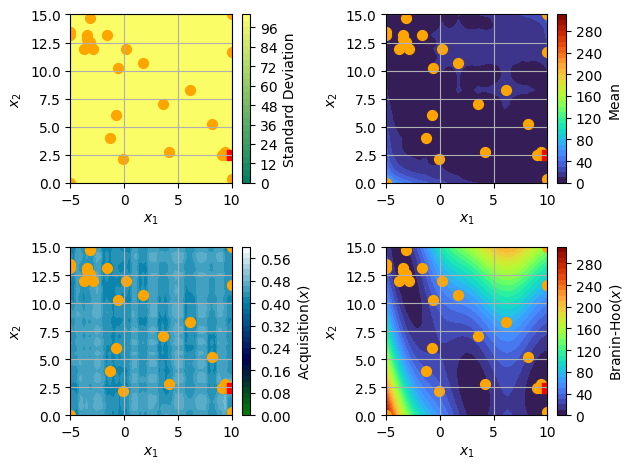

Current best value: 0.404492697787159
Next point to test: [10.          2.44897959]
Value of next point:  2.250031194230294


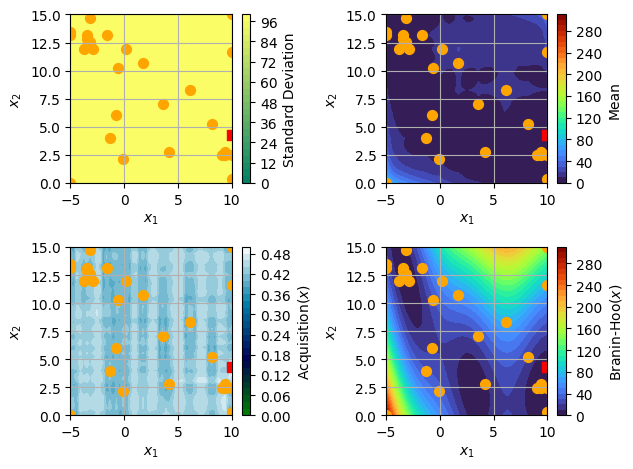

Current best value: 0.404492697787159
Next point to test: [10.          4.28571429]
Value of next point:  3.5886079297824622


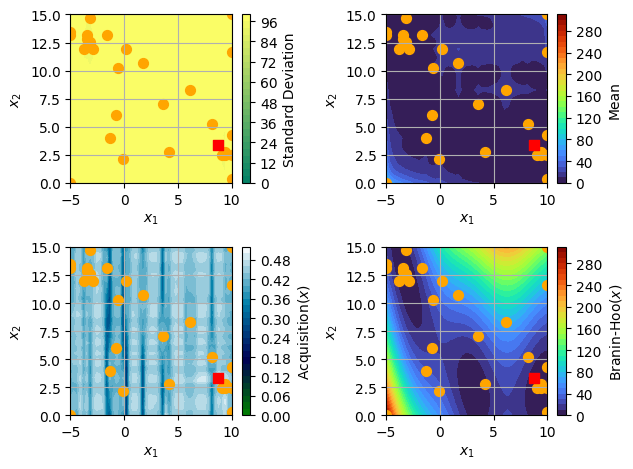

Current best value: 0.404492697787159
Next point to test: [8.7755102  3.36734694]
Value of next point:  4.2714385362932425


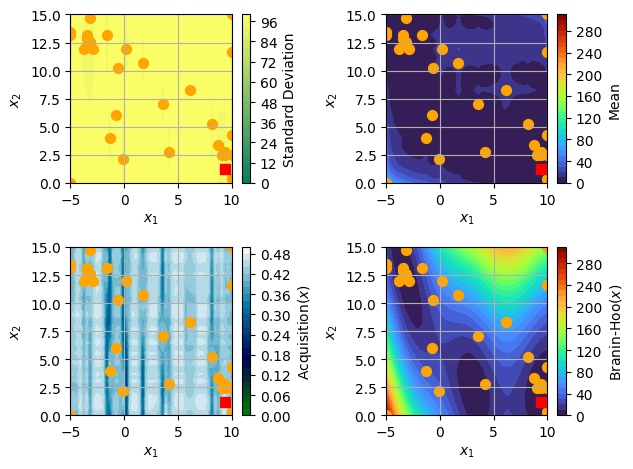

Current best value: 0.404492697787159
Next point to test: [9.3877551 1.2244898]
Value of next point:  1.8915444826248695


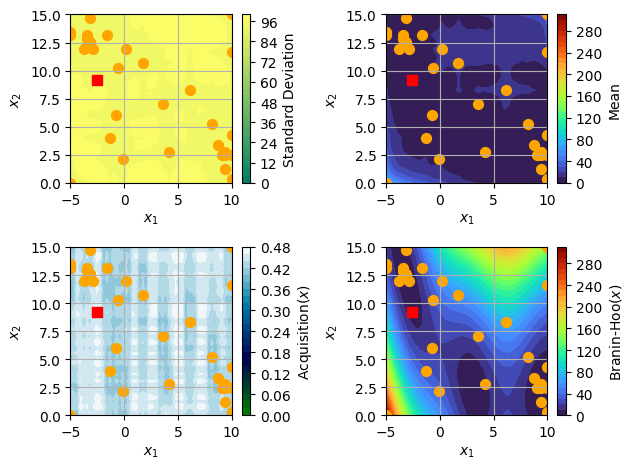

Current best value: 0.404492697787159
Next point to test: [-2.55102041  9.18367347]
Value of next point:  4.972692087968527


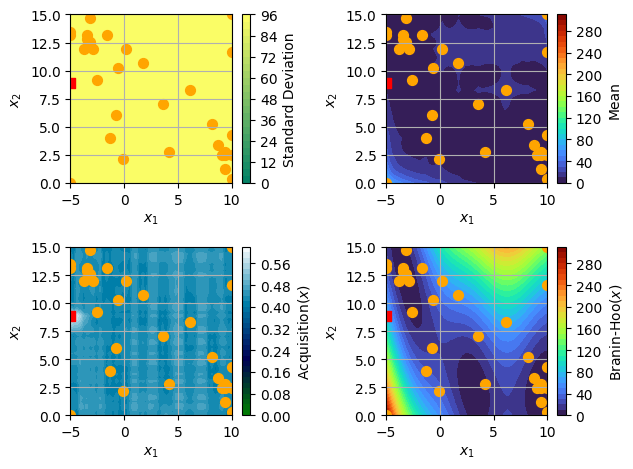

Current best value: 0.404492697787159
Next point to test: [-5.          8.87755102]
Value of next point:  81.7766795932092


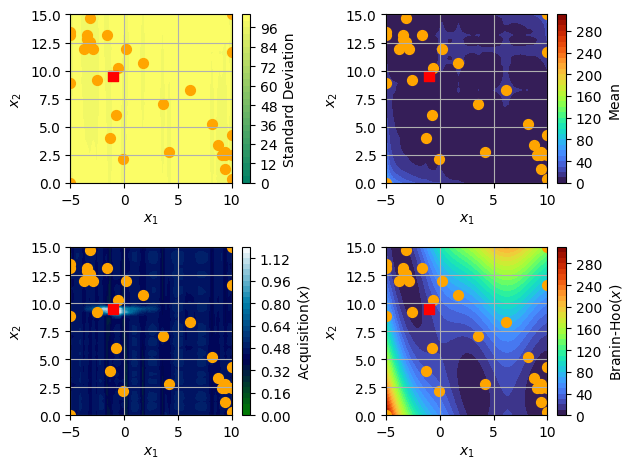

Current best value: 0.404492697787159
Next point to test: [-1.02040816  9.48979592]
Value of next point:  18.019321752791697


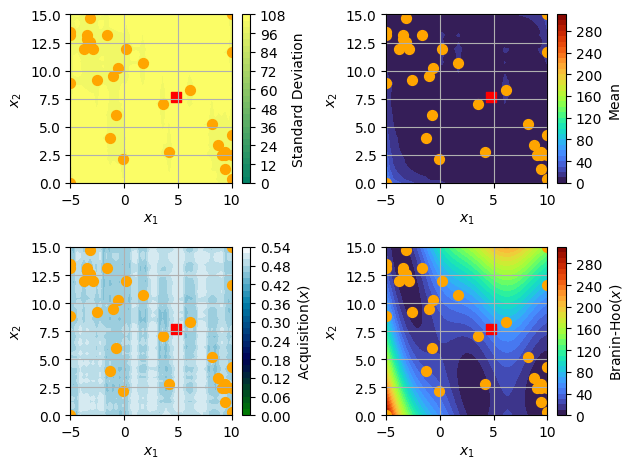

Current best value: 0.404492697787159
Next point to test: [4.79591837 7.65306122]
Value of next point:  50.67594415423443


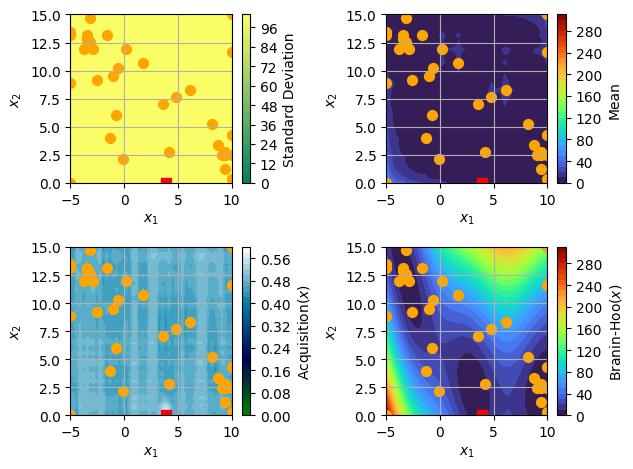

Current best value: 0.404492697787159
Next point to test: [3.87755102 0.        ]
Value of next point:  6.019568057447531


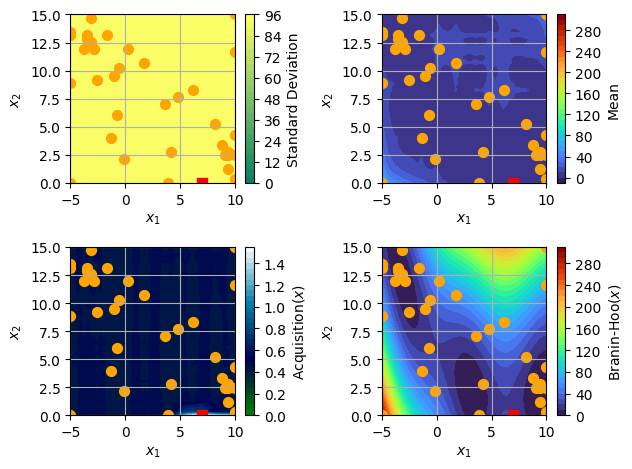

Current best value: 0.404492697787159
Next point to test: [6.93877551 0.        ]
Value of next point:  18.995378698278323


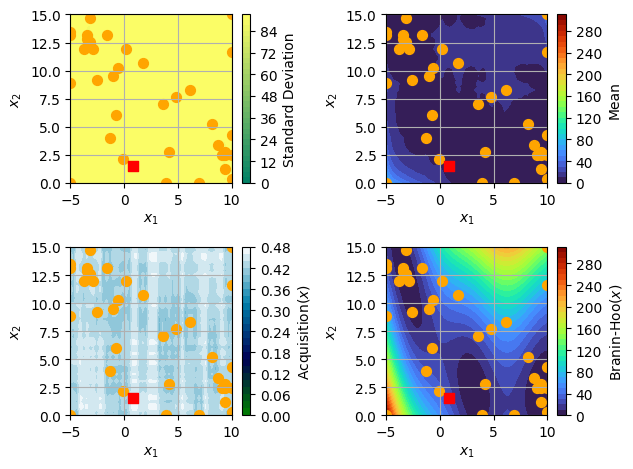

Current best value: 0.404492697787159
Next point to test: [0.81632653 1.53061224]
Value of next point:  27.17968008224601


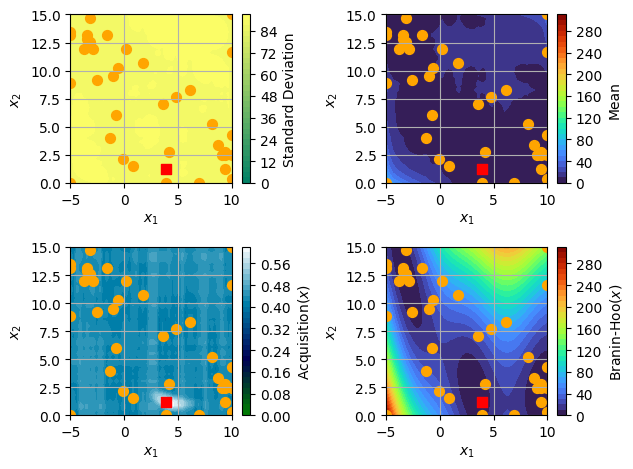

Current best value: 0.404492697787159
Next point to test: [3.87755102 1.2244898 ]
Value of next point:  3.1817345918926225


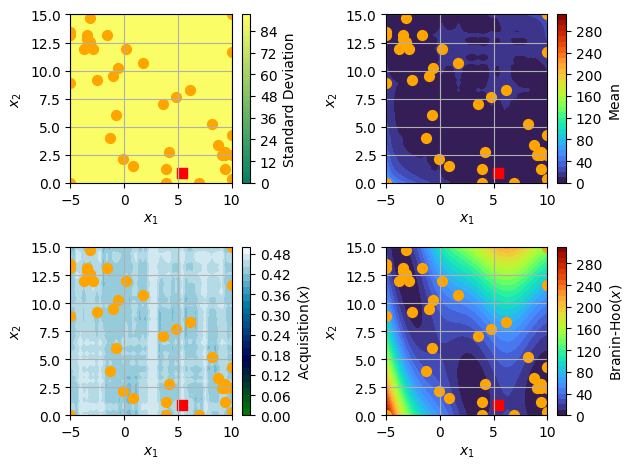

Current best value: 0.404492697787159
Next point to test: [5.40816327 0.91836735]
Value of next point:  16.21861468443478


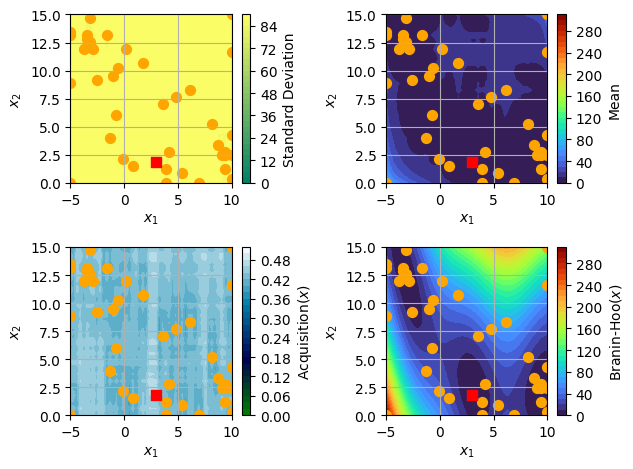

Current best value: 0.404492697787159
Next point to test: [2.95918367 1.83673469]
Value of next point:  0.8992015474906996


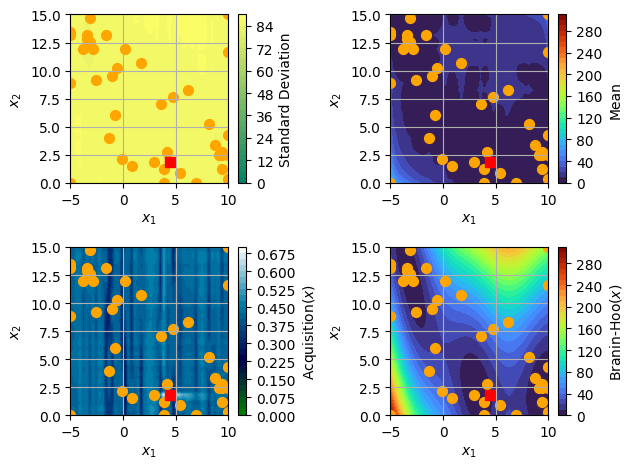

Current best value: 0.404492697787159
Next point to test: [4.48979592 1.83673469]
Value of next point:  8.023377213673855


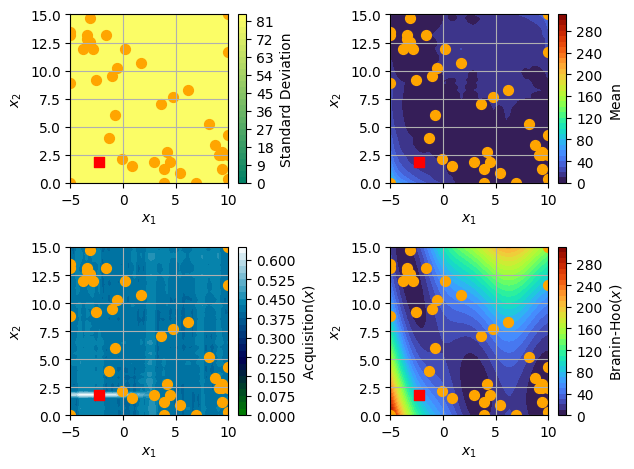

Current best value: 0.404492697787159
Next point to test: [-2.24489796  1.83673469]
Value of next point:  74.35094507475083


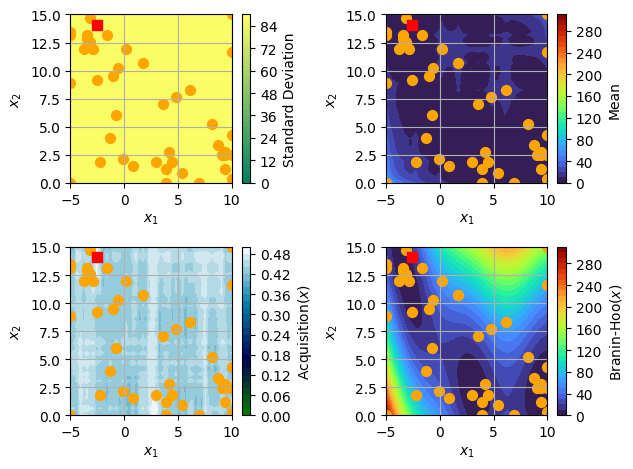

Current best value: 0.404492697787159
Next point to test: [-2.55102041 14.08163265]
Value of next point:  12.142161055137166


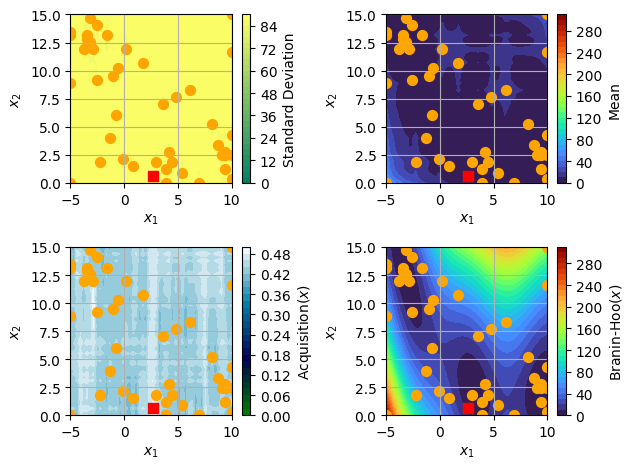

Current best value: 0.404492697787159
Next point to test: [2.65306122 0.6122449 ]
Value of next point:  5.824963804068688


In [17]:
fmin_Matern52_EI=BayesianOPT(x_sample,y_sample,branin_hoo,space,kernel="Matern",acq="EI",n_gpr=n_gpr,n_iter=n_iter)

This block is the iteration for Matern52 kernel with upper confidence bound.

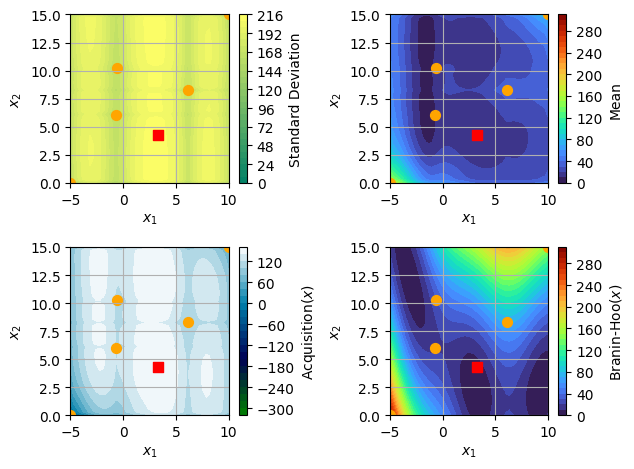

Current best value: 4.9032092248334385
Next point to test: [3.26530612 4.28571429]
Value of next point:  4.9032092248334385


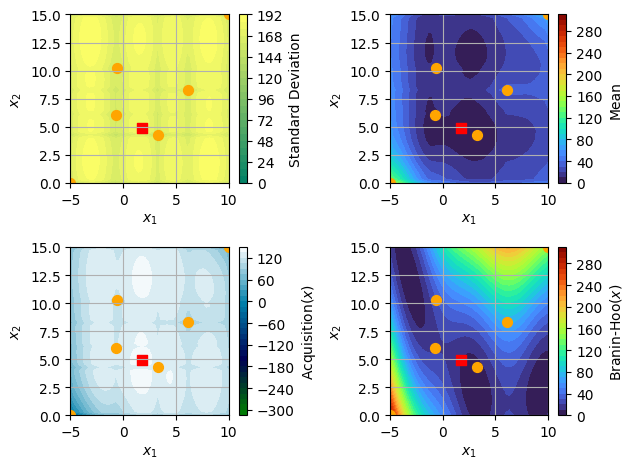

Current best value: 4.9032092248334385
Next point to test: [1.73469388 4.89795918]
Value of next point:  10.046359096256278


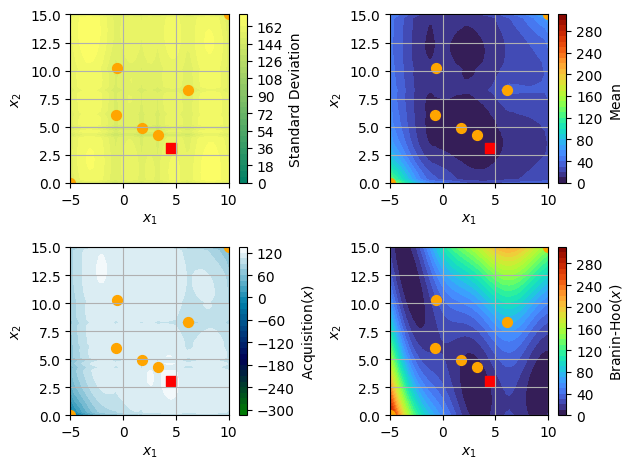

Current best value: 4.9032092248334385
Next point to test: [4.48979592 3.06122449]
Value of next point:  10.449277261515475


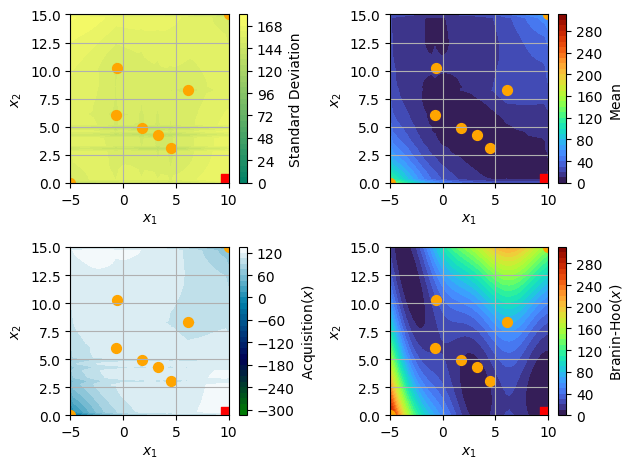

Current best value: 4.9032092248334385
Next point to test: [9.69387755 0.30612245]
Value of next point:  6.528561507997222


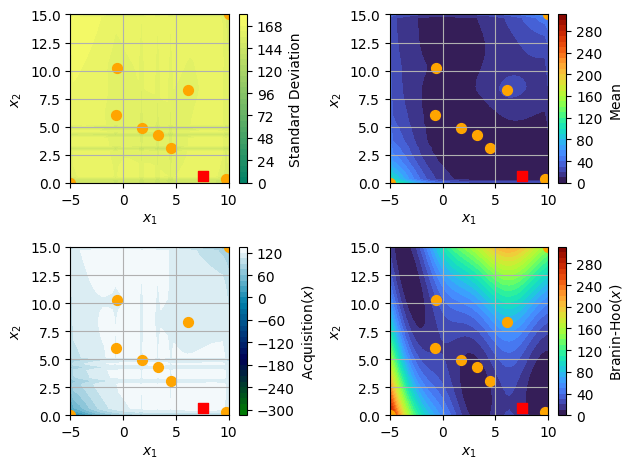

Current best value: 4.9032092248334385
Next point to test: [7.55102041 0.6122449 ]
Value of next point:  13.406117792682041


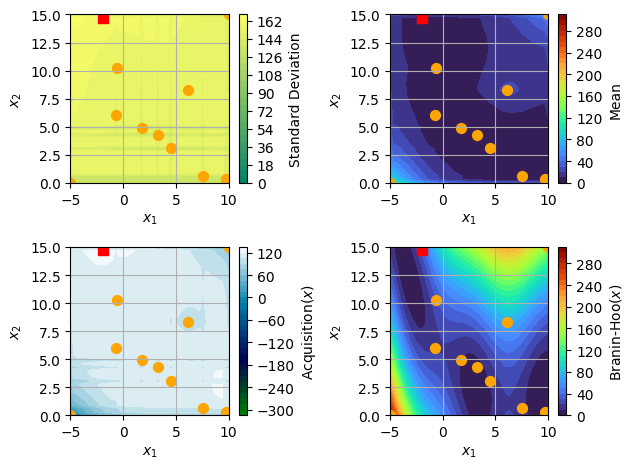

Current best value: 4.9032092248334385
Next point to test: [-1.93877551 14.69387755]
Value of next point:  32.78721771903611


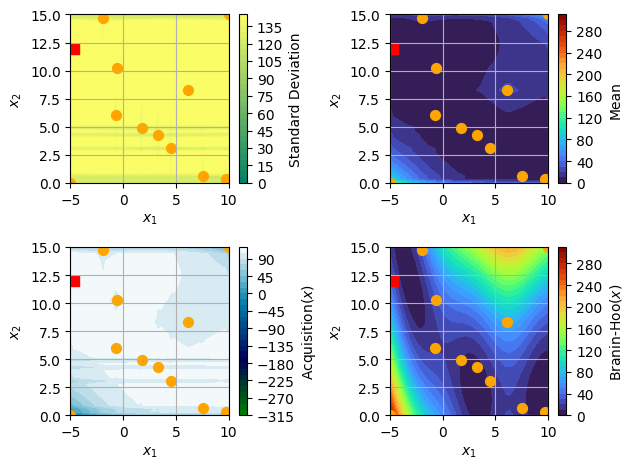

Current best value: 4.9032092248334385
Next point to test: [-4.69387755 11.93877551]
Value of next point:  28.989308043332052


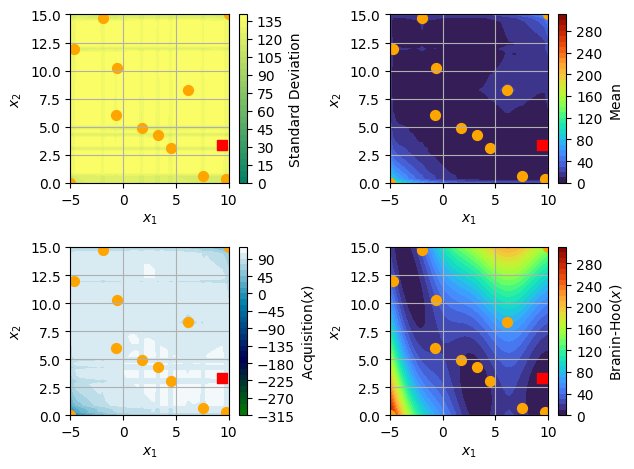

Current best value: 1.257133888313394
Next point to test: [9.3877551  3.36734694]
Value of next point:  1.257133888313394


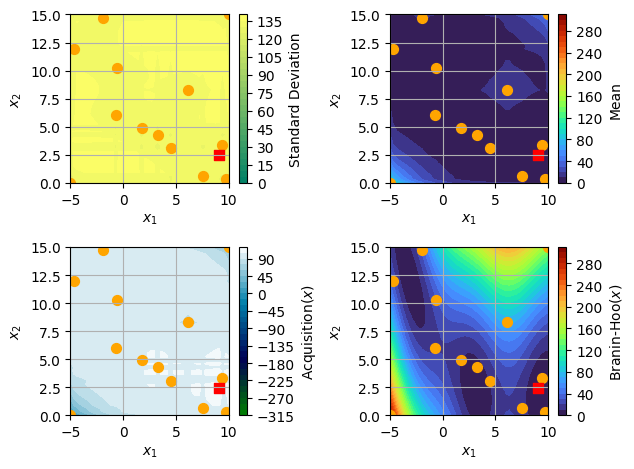

Current best value: 1.0192925976815097
Next point to test: [9.08163265 2.44897959]
Value of next point:  1.0192925976815097


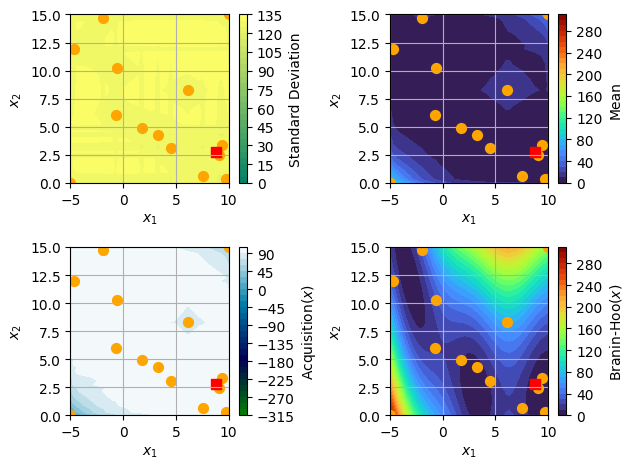

Current best value: 1.0192925976815097
Next point to test: [8.7755102  2.75510204]
Value of next point:  2.949677653290247


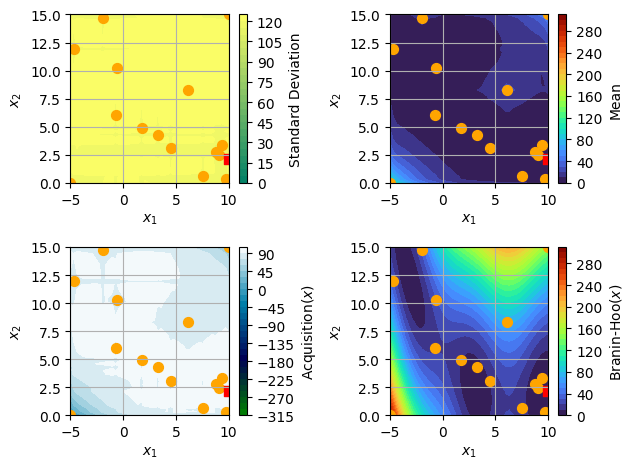

Current best value: 1.0192925976815097
Next point to test: [10.          2.14285714]
Value of next point:  2.6829117480231055


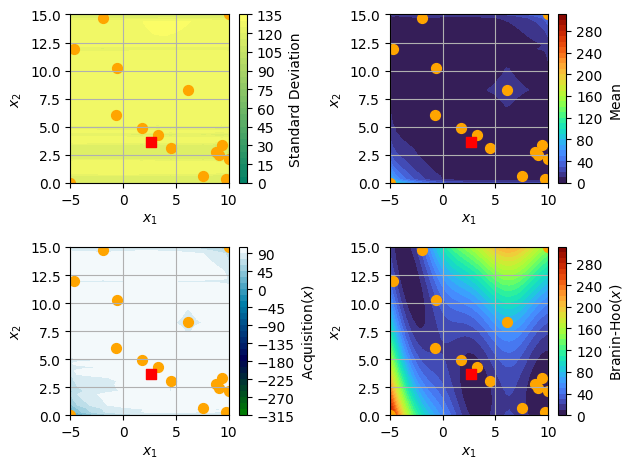

Current best value: 1.0192925976815097
Next point to test: [2.65306122 3.67346939]
Value of next point:  2.4945955147176386


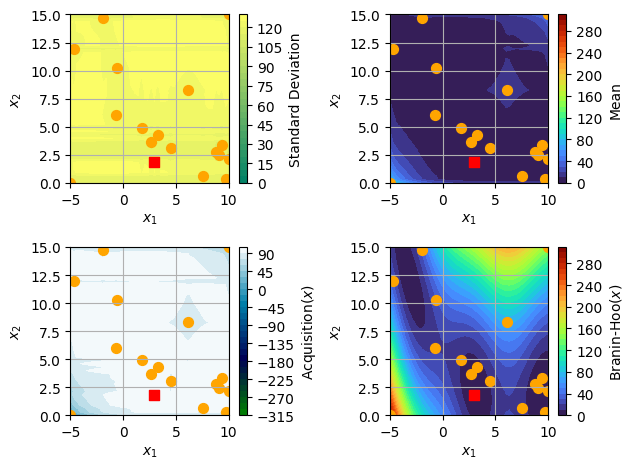

Current best value: 0.8992015474906996
Next point to test: [2.95918367 1.83673469]
Value of next point:  0.8992015474906996


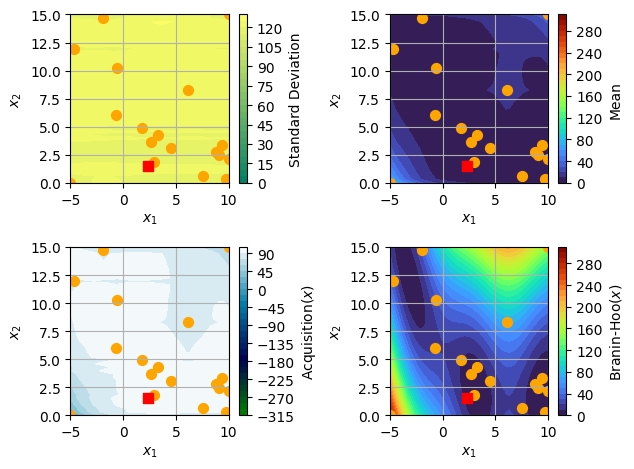

Current best value: 0.8992015474906996
Next point to test: [2.34693878 1.53061224]
Value of next point:  5.363413052528896


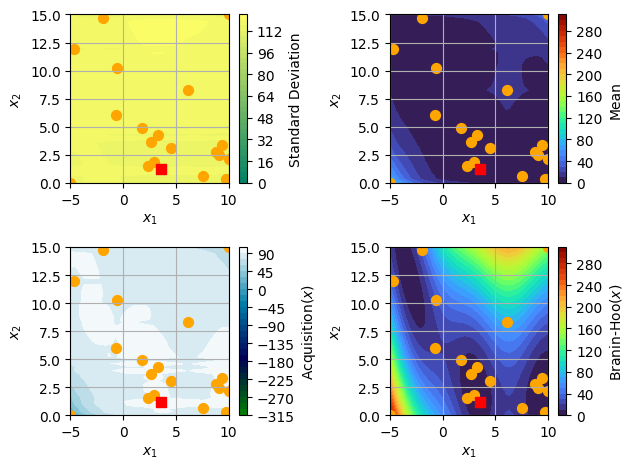

Current best value: 0.8992015474906996
Next point to test: [3.57142857 1.2244898 ]
Value of next point:  1.8177192018762067


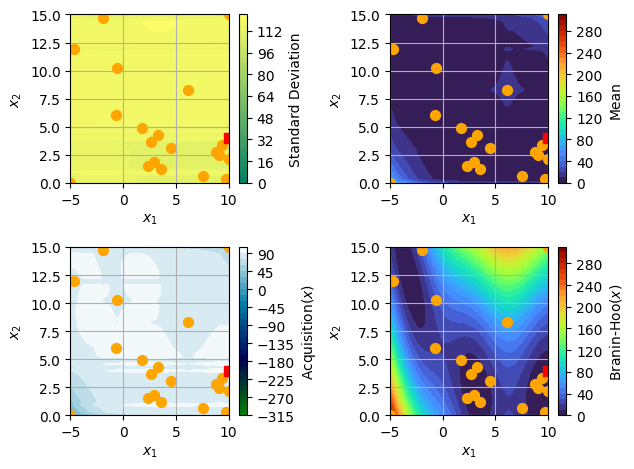

Current best value: 0.8992015474906996
Next point to test: [10.          3.97959184]
Value of next point:  2.8969570383441168


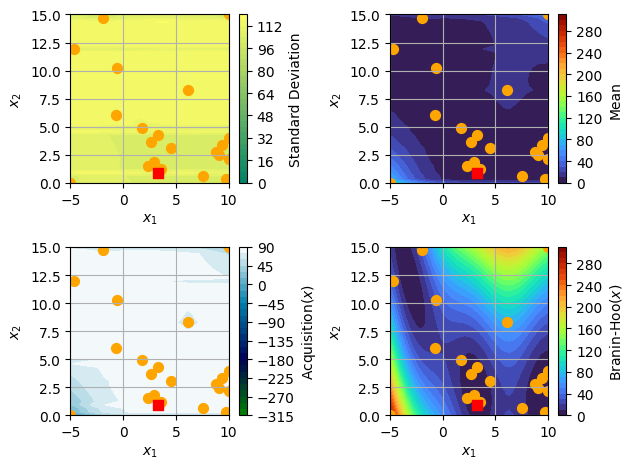

Current best value: 0.8992015474906996
Next point to test: [3.26530612 0.91836735]
Value of next point:  2.064247955080466


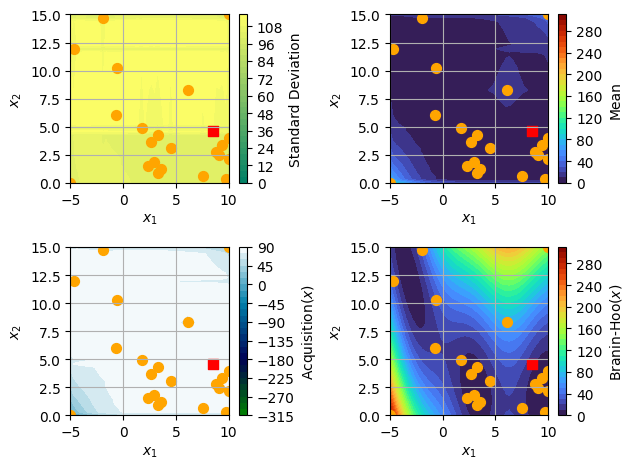

Current best value: 0.8992015474906996
Next point to test: [8.46938776 4.59183673]
Value of next point:  12.323769606975548


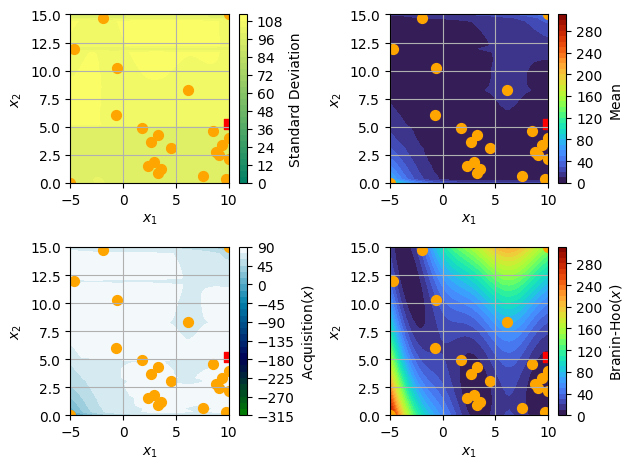

Current best value: 0.8992015474906996
Next point to test: [10.          5.20408163]
Value of next point:  6.788092049328638


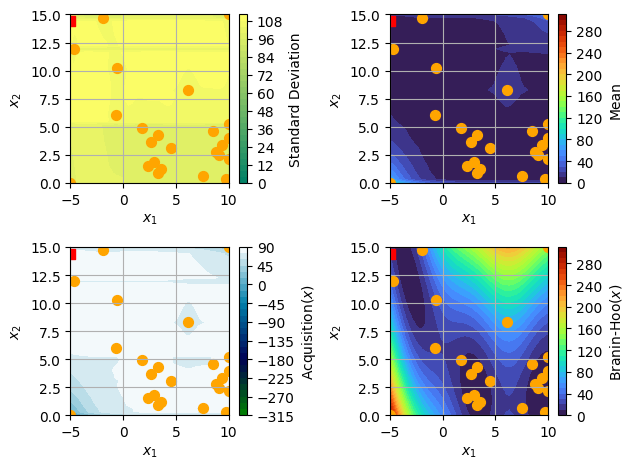

Current best value: 0.8992015474906996
Next point to test: [-5.        14.3877551]
Value of next point:  20.56154318782781


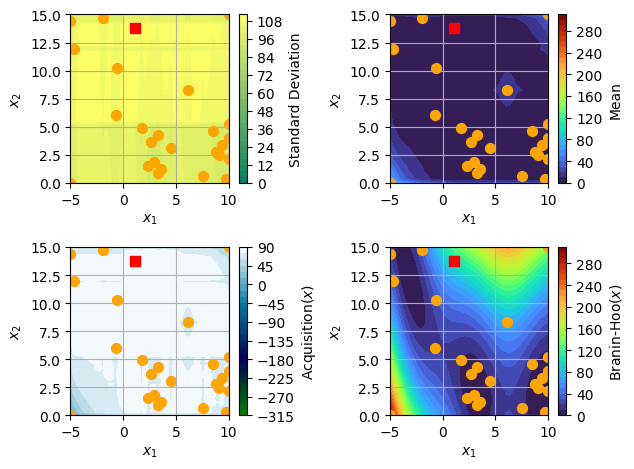

Current best value: 0.8992015474906996
Next point to test: [ 1.12244898 13.7755102 ]
Value of next point:  102.50696709676403


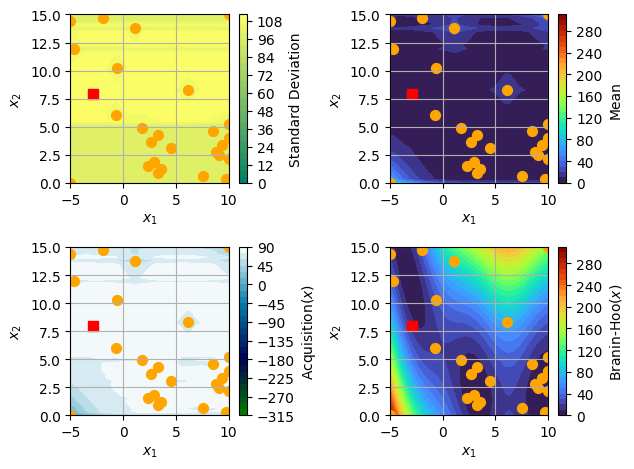

Current best value: 0.8992015474906996
Next point to test: [-2.85714286  7.95918367]
Value of next point:  14.052765686726937


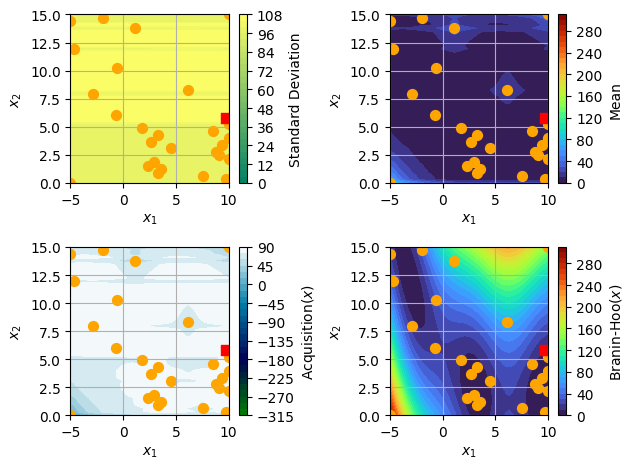

Current best value: 0.8992015474906996
Next point to test: [9.69387755 5.81632653]
Value of next point:  10.384364699483106


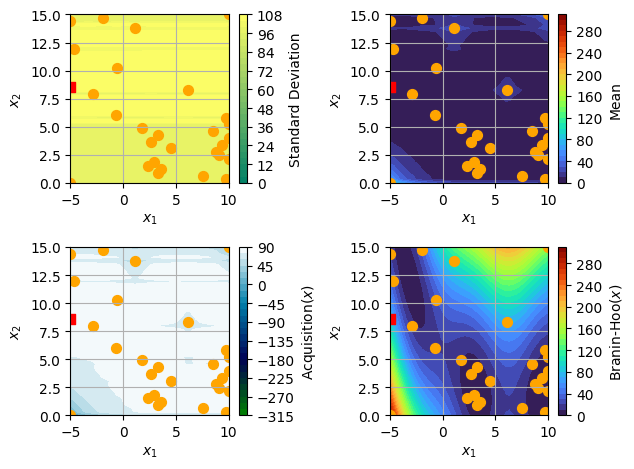

Current best value: 0.8992015474906996
Next point to test: [-5.          8.57142857]
Value of next point:  86.9580286262353


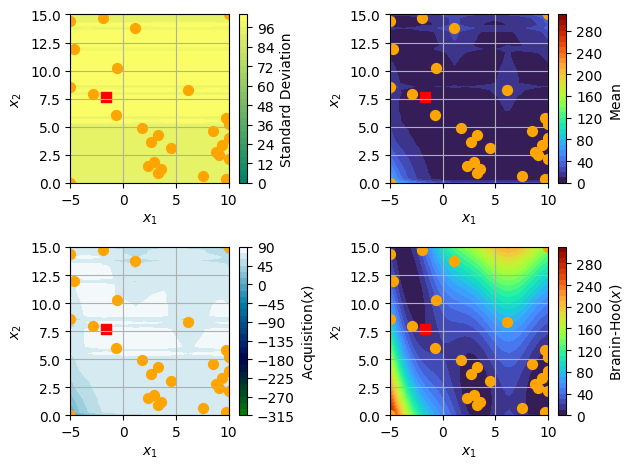

Current best value: 0.8992015474906996
Next point to test: [-1.63265306  7.65306122]
Value of next point:  11.069840695991816


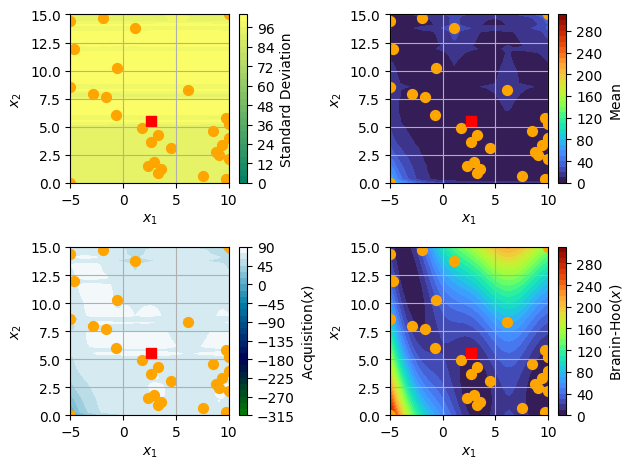

Current best value: 0.8992015474906996
Next point to test: [2.65306122 5.51020408]
Value of next point:  9.492626102956237


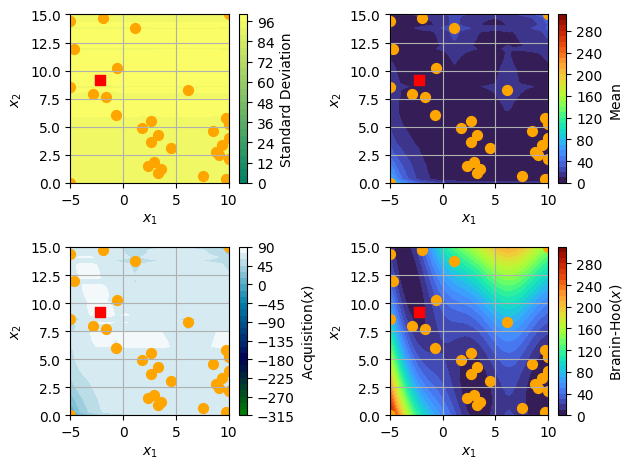

Current best value: 0.8992015474906996
Next point to test: [-2.24489796  9.18367347]
Value of next point:  5.088473866558379


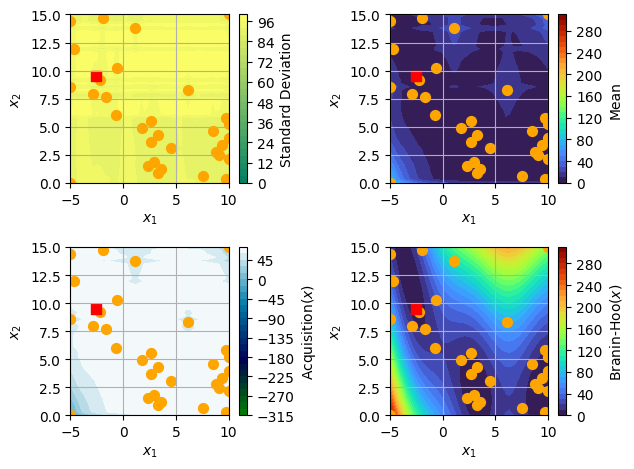

Current best value: 0.8992015474906996
Next point to test: [-2.55102041  9.48979592]
Value of next point:  4.015119591877625


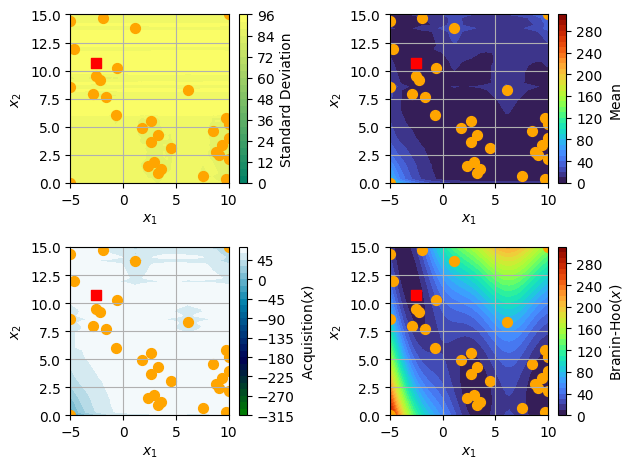

Current best value: 0.8992015474906996
Next point to test: [-2.55102041 10.71428571]
Value of next point:  2.059048682899271


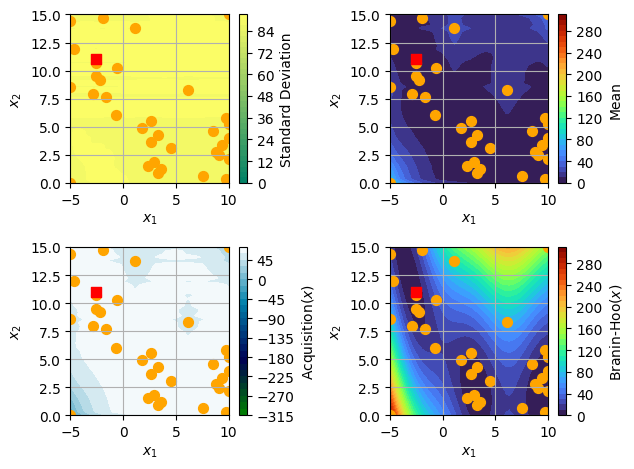

Current best value: 0.8992015474906996
Next point to test: [-2.55102041 11.02040816]
Value of next point:  2.0385857245009973


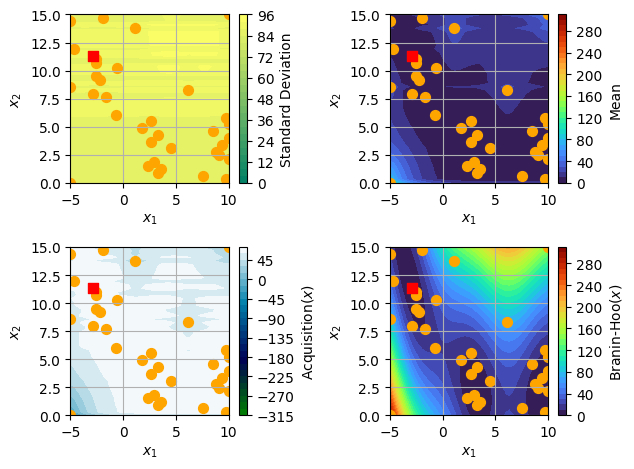

Current best value: 0.8595383166889992
Next point to test: [-2.85714286 11.32653061]
Value of next point:  0.8595383166889992


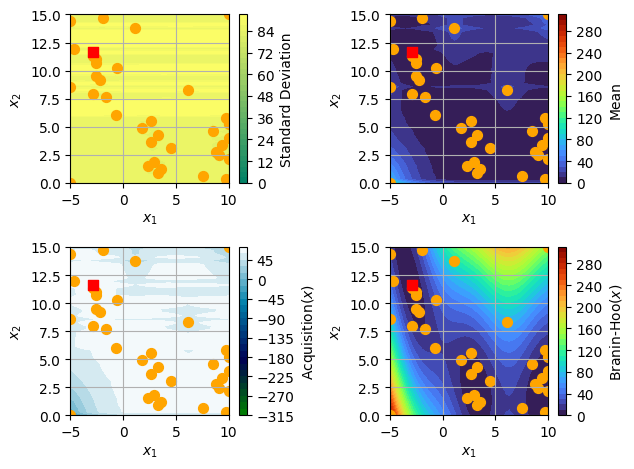

Current best value: 0.7846854555530669
Next point to test: [-2.85714286 11.63265306]
Value of next point:  0.7846854555530669


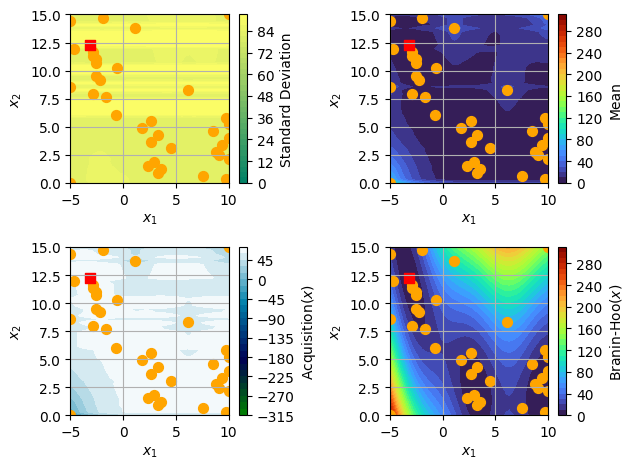

Current best value: 0.4069069620446708
Next point to test: [-3.16326531 12.24489796]
Value of next point:  0.4069069620446708


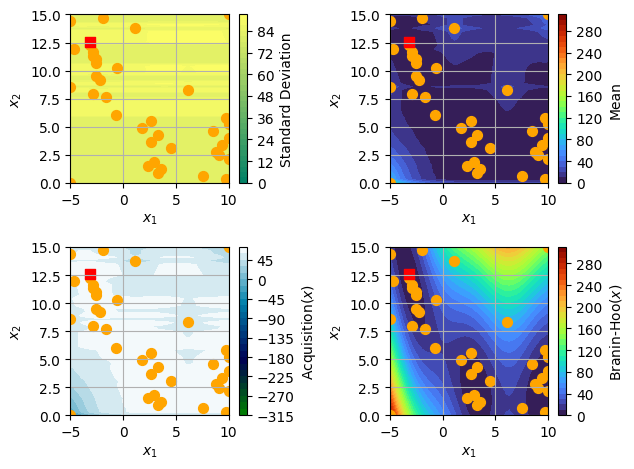

Current best value: 0.4069069620446708
Next point to test: [-3.16326531 12.55102041]
Value of next point:  0.45026242787601944


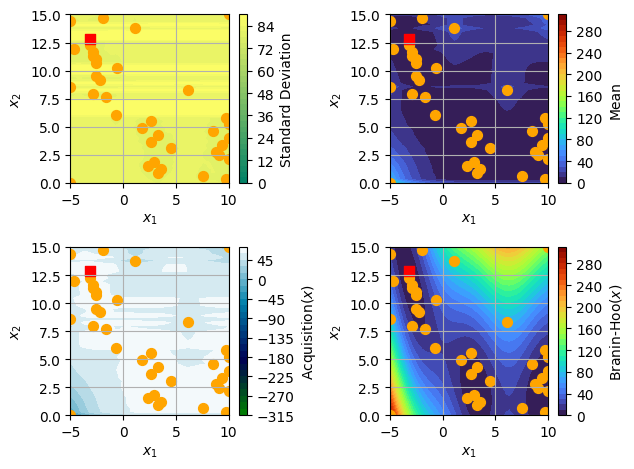

Current best value: 0.4069069620446708
Next point to test: [-3.16326531 12.85714286]
Value of next point:  0.6810398012458947


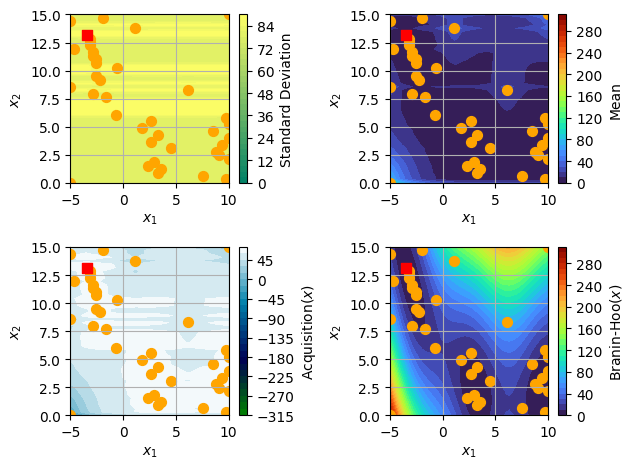

Current best value: 0.4069069620446708
Next point to test: [-3.46938776 13.16326531]
Value of next point:  0.9166584398244382


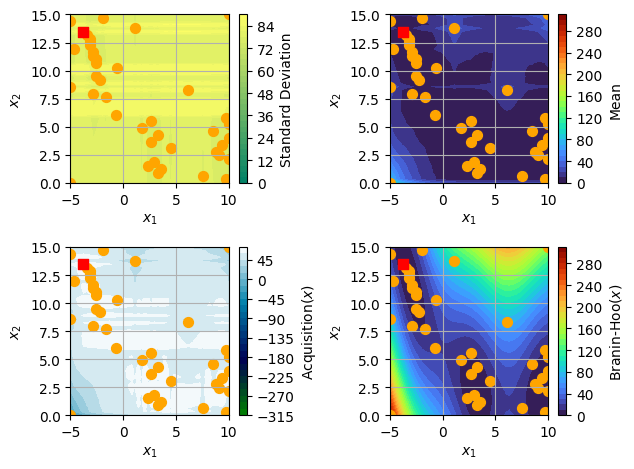

Current best value: 0.4069069620446708
Next point to test: [-3.7755102  13.46938776]
Value of next point:  2.4085965794008306


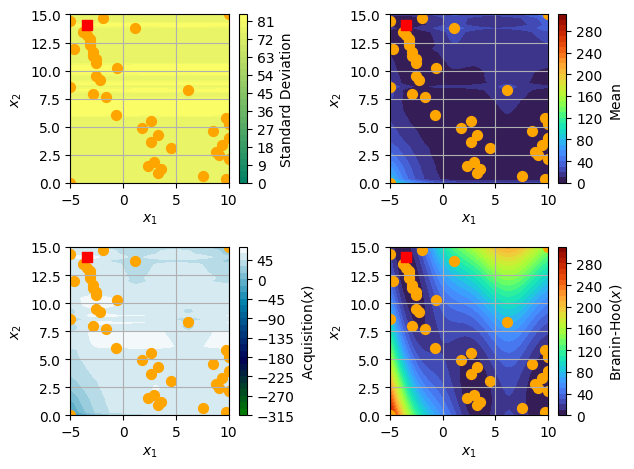

Current best value: 0.4069069620446708
Next point to test: [-3.46938776 14.08163265]
Value of next point:  1.9191445073351439


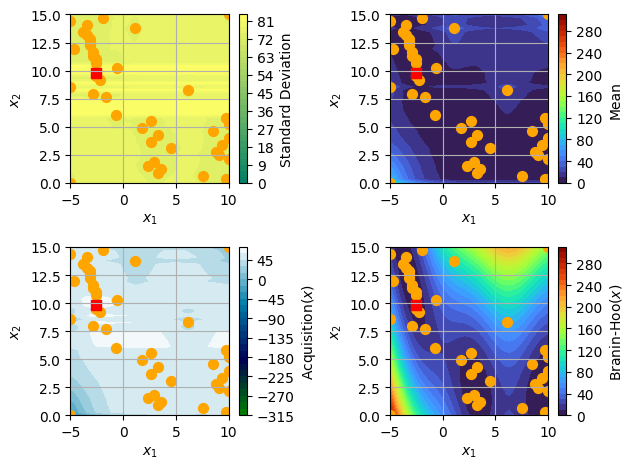

Current best value: 0.4069069620446708
Next point to test: [-2.55102041  9.79591837]
Value of next point:  3.2449690033252487


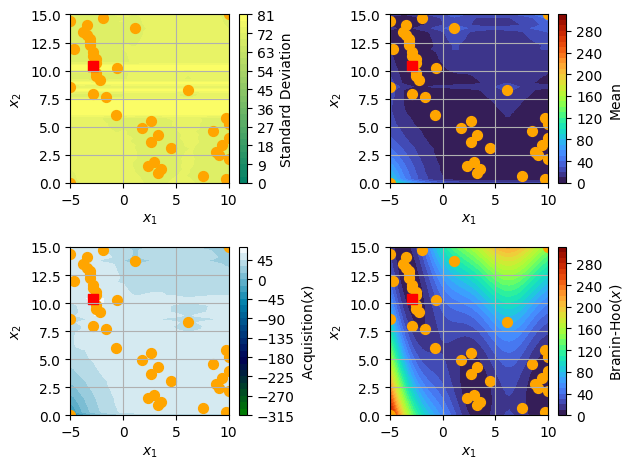

Current best value: 0.4069069620446708
Next point to test: [-2.85714286 10.40816327]
Value of next point:  2.2086283453279494


In [18]:
fmin_Matern52_LCB=BayesianOPT(x_sample,y_sample,branin_hoo,space,kernel="Matern",acq="LCB",n_gpr=n_gpr,n_iter=n_iter)

This block is the iteration for RBF kernel with expected improvement.

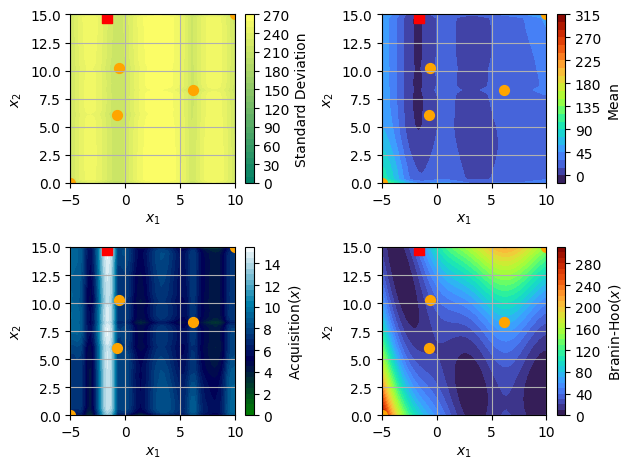

Current best value: 18.538588464818865
Next point to test: [-1.63265306 14.69387755]
Value of next point:  42.48135551439738


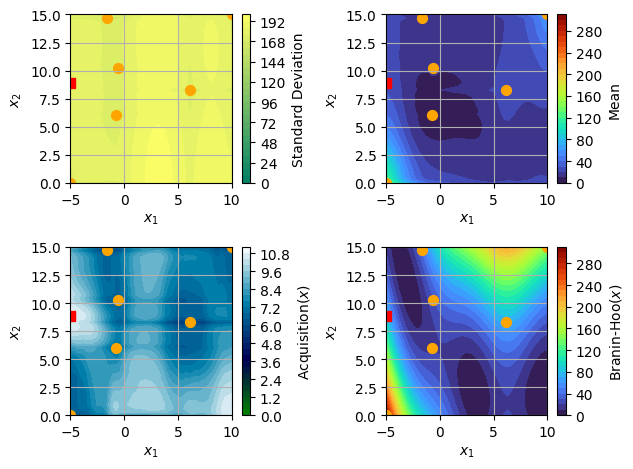

Current best value: 18.538588464818865
Next point to test: [-5.          8.87755102]
Value of next point:  81.7766795932092


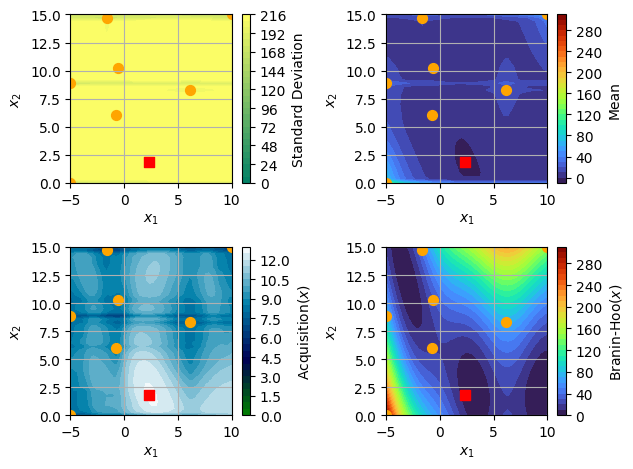

Current best value: 4.572012167642283
Next point to test: [2.34693878 1.83673469]
Value of next point:  4.572012167642283


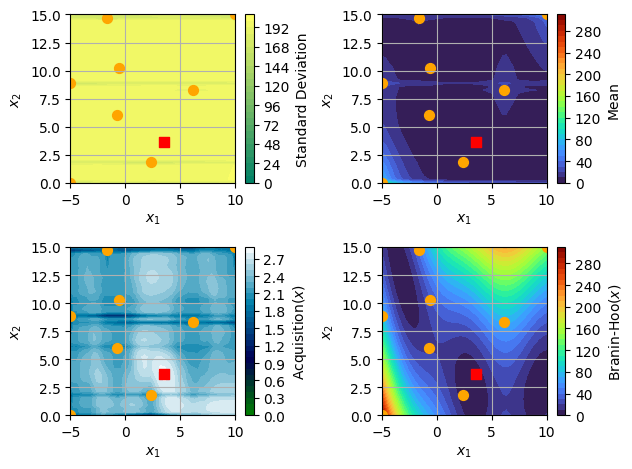

Current best value: 4.194811966140658
Next point to test: [3.57142857 3.67346939]
Value of next point:  4.194811966140658


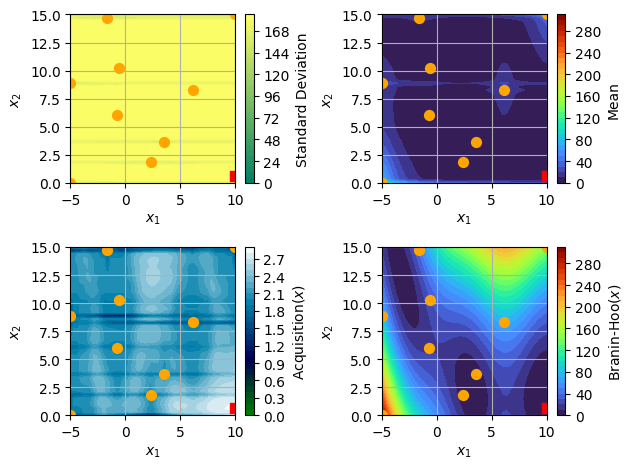

Current best value: 4.194811966140658
Next point to test: [10.         0.6122449]
Value of next point:  7.658643130065052


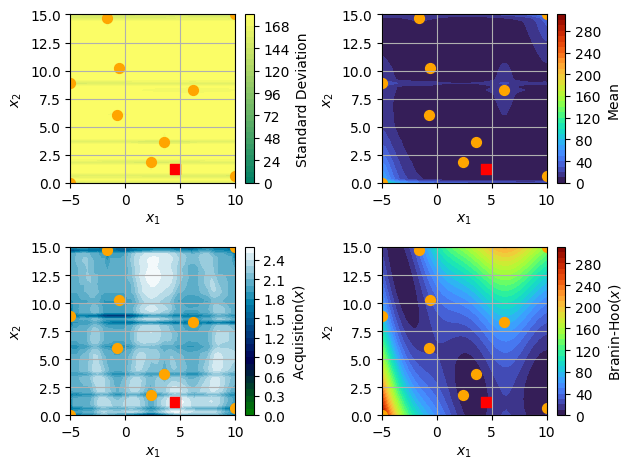

Current best value: 4.194811966140658
Next point to test: [4.48979592 1.2244898 ]
Value of next point:  7.9349586349842


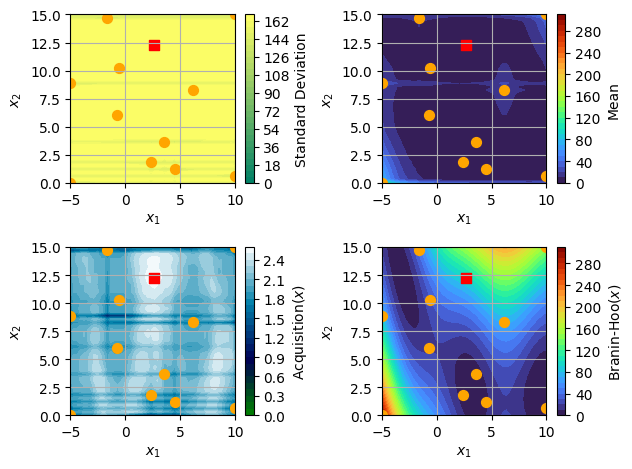

Current best value: 4.194811966140658
Next point to test: [ 2.65306122 12.24489796]
Value of next point:  92.87801911503036


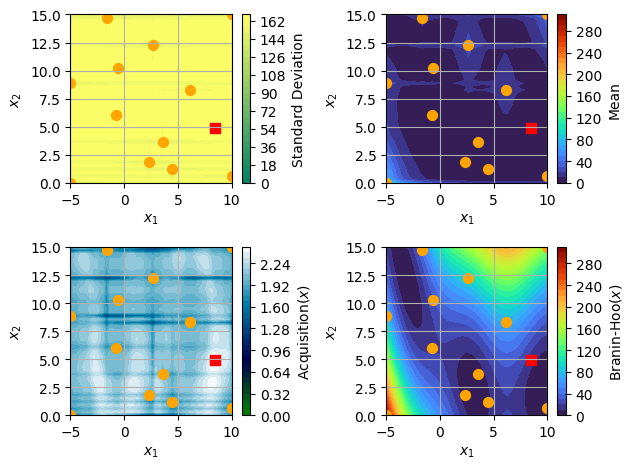

Current best value: 4.194811966140658
Next point to test: [8.46938776 4.89795918]
Value of next point:  14.134712901966964


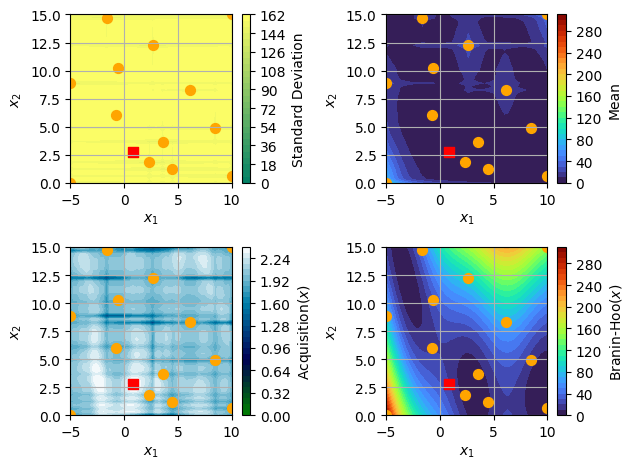

Current best value: 4.194811966140658
Next point to test: [0.81632653 2.75510204]
Value of next point:  20.704563425041048


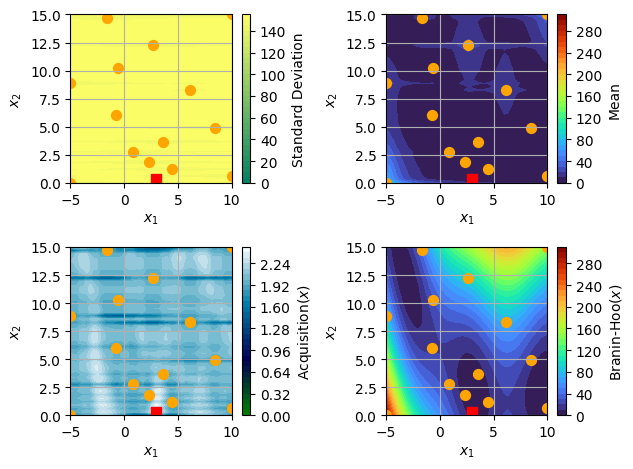

Current best value: 4.194811966140658
Next point to test: [2.95918367 0.30612245]
Value of next point:  5.0322314900397584


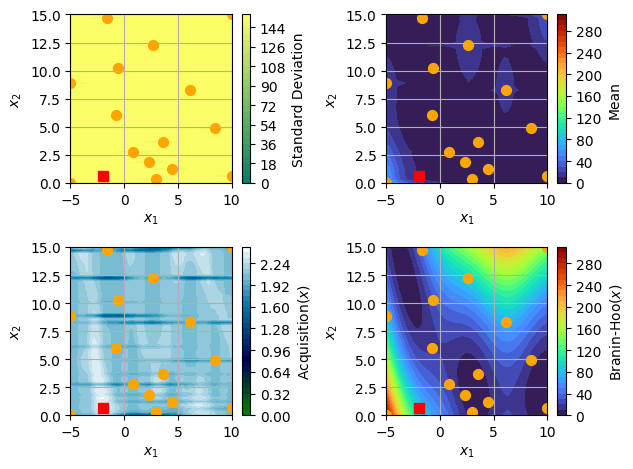

Current best value: 4.194811966140658
Next point to test: [-1.93877551  0.6122449 ]
Value of next point:  86.80946064854652


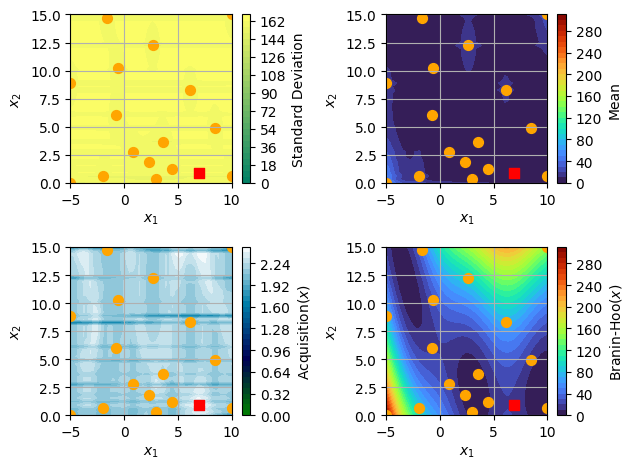

Current best value: 4.194811966140658
Next point to test: [6.93877551 0.91836735]
Value of next point:  17.67805839454352


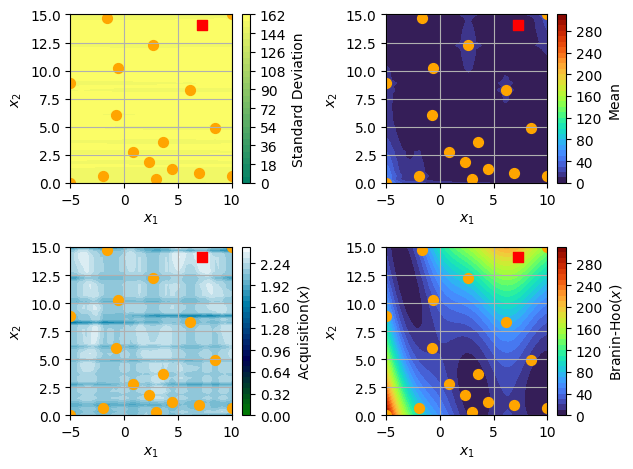

Current best value: 4.194811966140658
Next point to test: [ 7.24489796 14.08163265]
Value of next point:  180.14191096755476


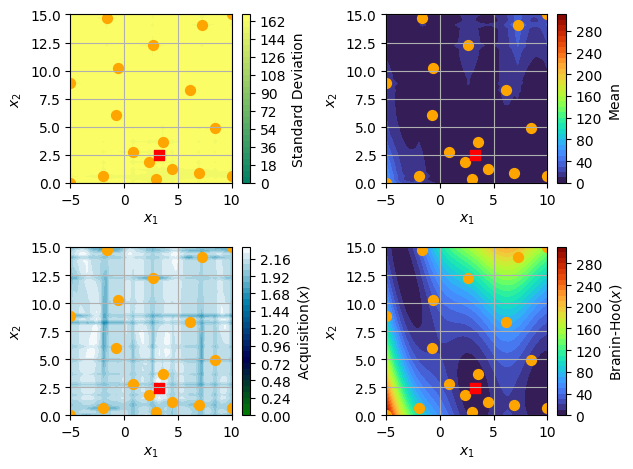

Current best value: 0.5433562827993885
Next point to test: [3.26530612 2.44897959]
Value of next point:  0.5433562827993885


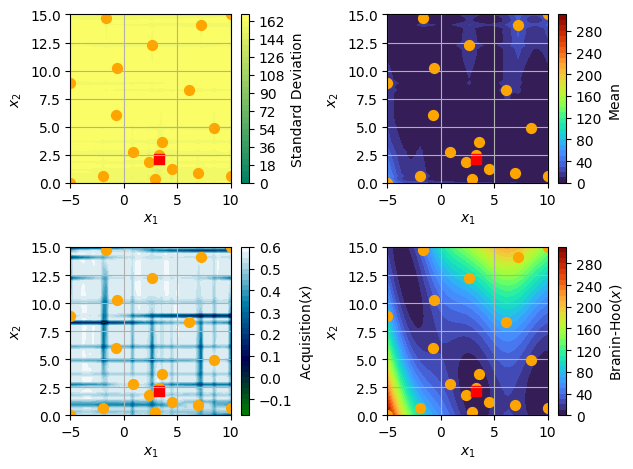

Current best value: 0.47269080217855297
Next point to test: [3.26530612 2.14285714]
Value of next point:  0.47269080217855297


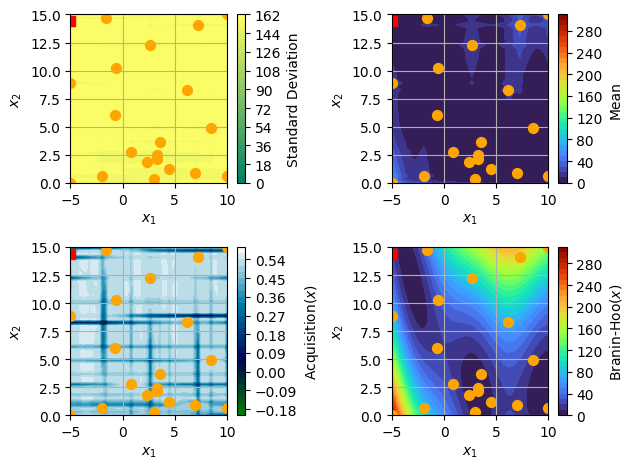

Current best value: 0.47269080217855297
Next point to test: [-5.        14.3877551]
Value of next point:  20.56154318782781


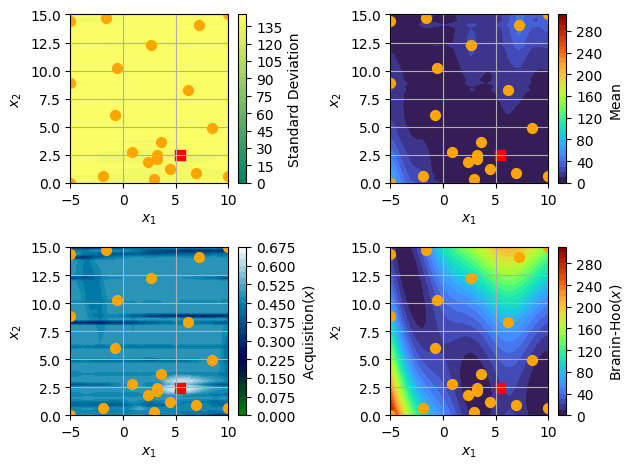

Current best value: 0.47269080217855297
Next point to test: [5.40816327 2.44897959]
Value of next point:  17.787842479630534


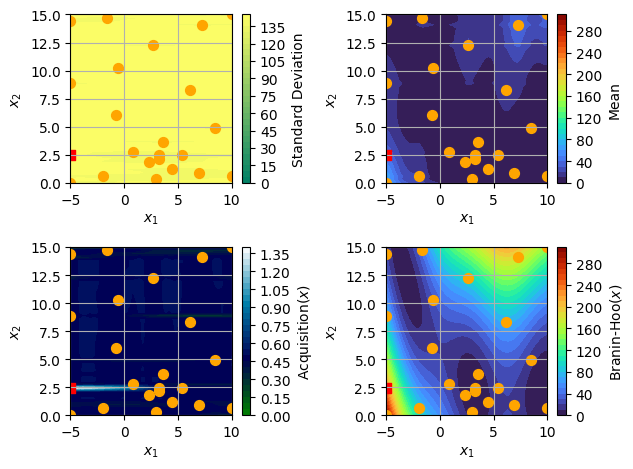

Current best value: 0.47269080217855297
Next point to test: [-5.          2.44897959]
Value of next point:  229.9436098698471


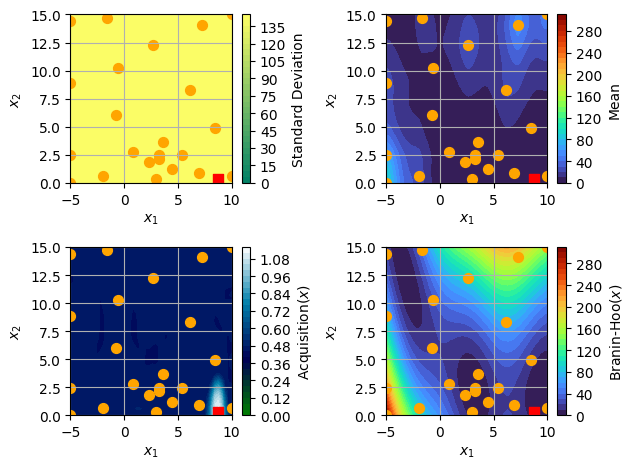

Current best value: 0.47269080217855297
Next point to test: [8.7755102  0.30612245]
Value of next point:  5.159510422819285


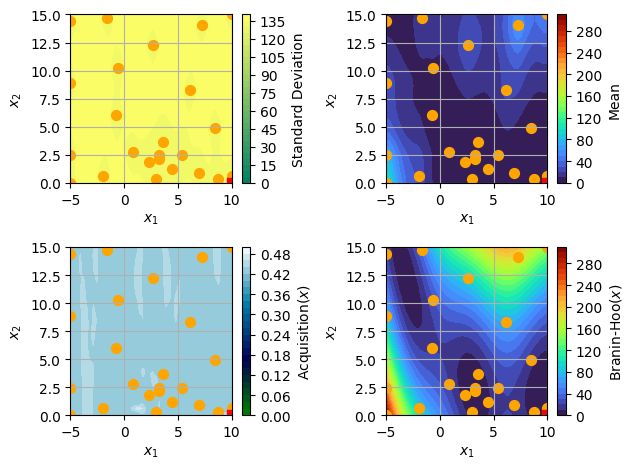

Current best value: 0.47269080217855297
Next point to test: [10.  0.]
Value of next point:  10.960889035651505


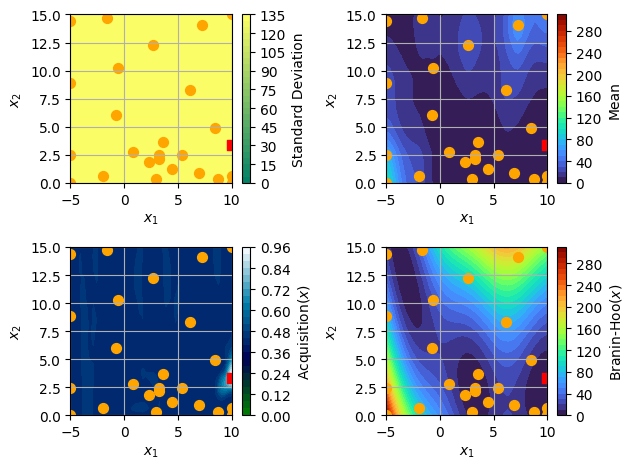

Current best value: 0.47269080217855297
Next point to test: [10.          3.36734694]
Value of next point:  2.075920978083011


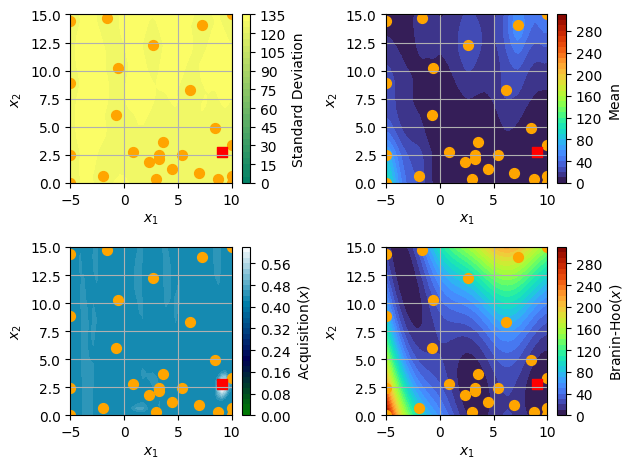

Current best value: 0.47269080217855297
Next point to test: [9.08163265 2.75510204]
Value of next point:  1.264974138013601


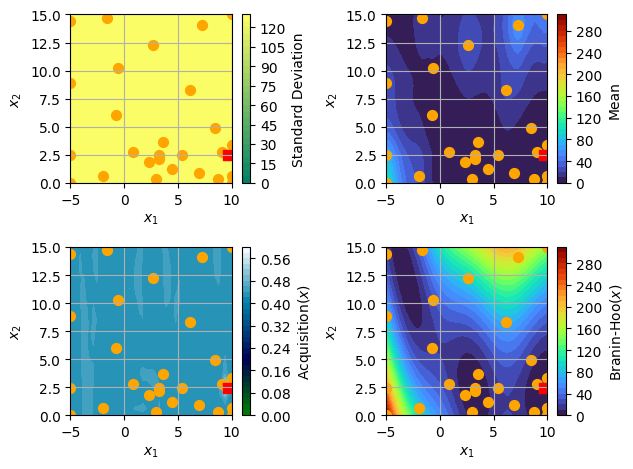

Current best value: 0.47269080217855297
Next point to test: [9.69387755 2.44897959]
Value of next point:  0.8122970866751604


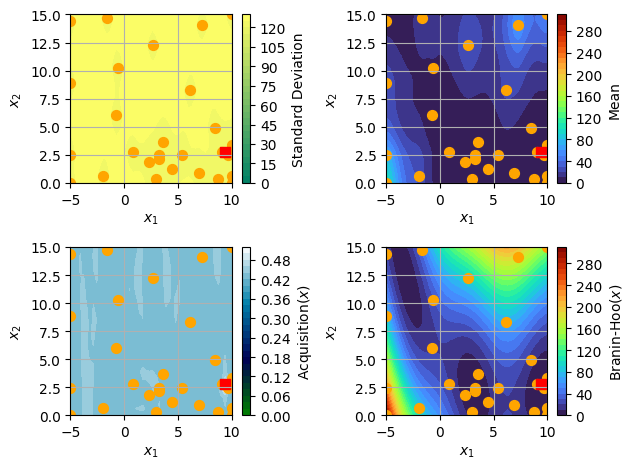

Current best value: 0.47269080217855297
Next point to test: [9.3877551  2.75510204]
Value of next point:  0.5012845204240453


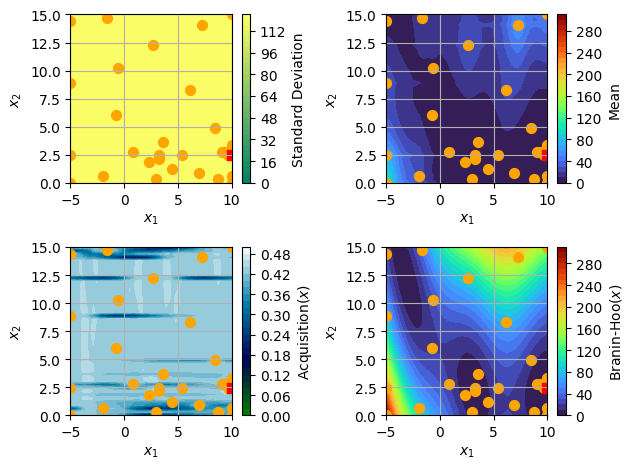

Current best value: 0.47269080217855297
Next point to test: [10.          2.44897959]
Value of next point:  2.250031194230294


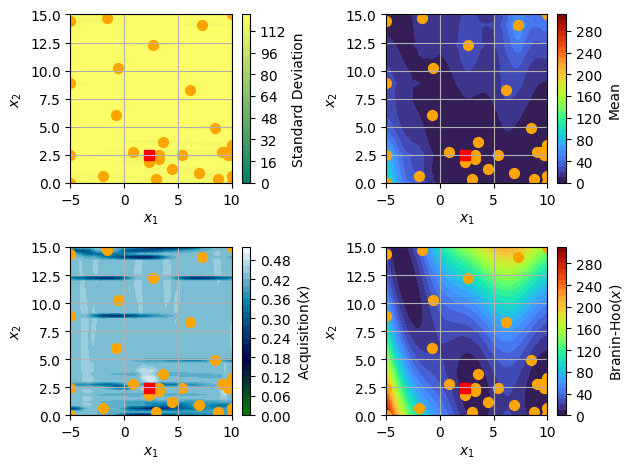

Current best value: 0.47269080217855297
Next point to test: [2.34693878 2.44897959]
Value of next point:  3.551476120484632


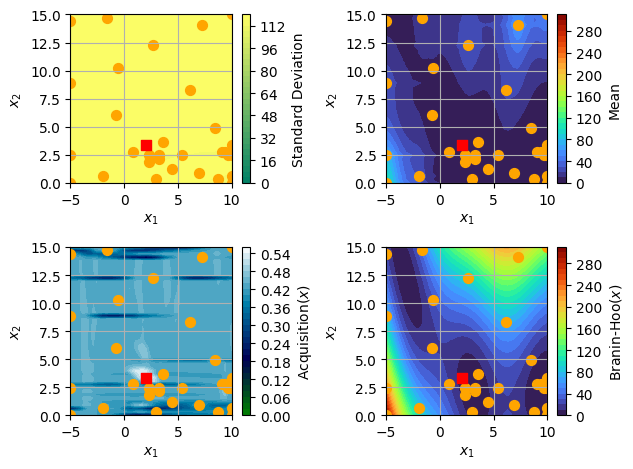

Current best value: 0.47269080217855297
Next point to test: [2.04081633 3.36734694]
Value of next point:  5.657148598783604


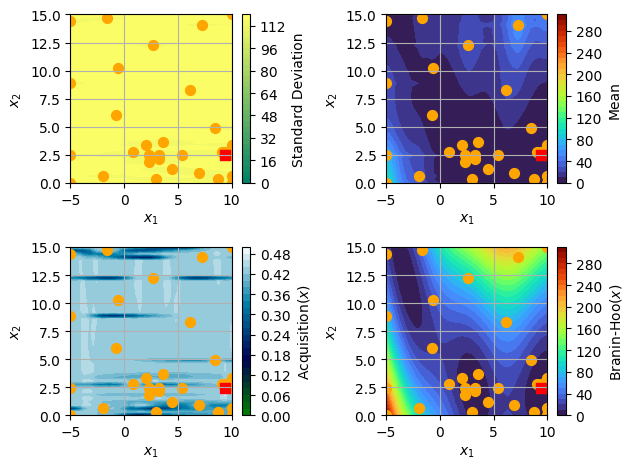

Current best value: 0.404492697787159
Next point to test: [9.3877551  2.44897959]
Value of next point:  0.404492697787159


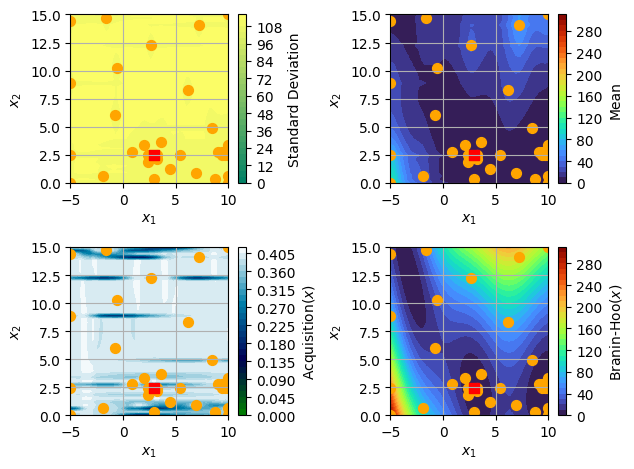

Current best value: 0.404492697787159
Next point to test: [2.95918367 2.44897959]
Value of next point:  0.5579429232407556


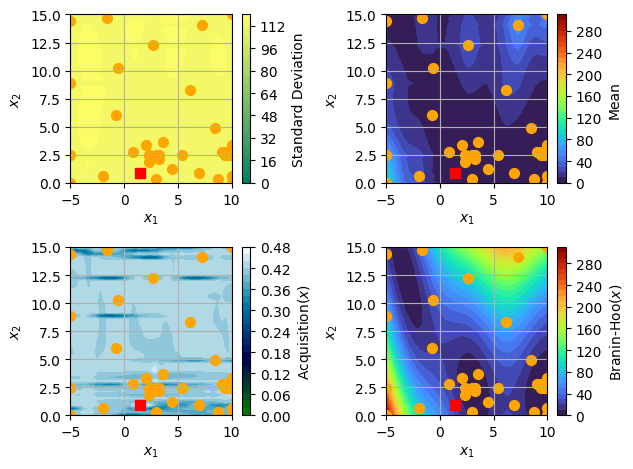

Current best value: 0.404492697787159
Next point to test: [1.42857143 0.91836735]
Value of next point:  20.795986067697914


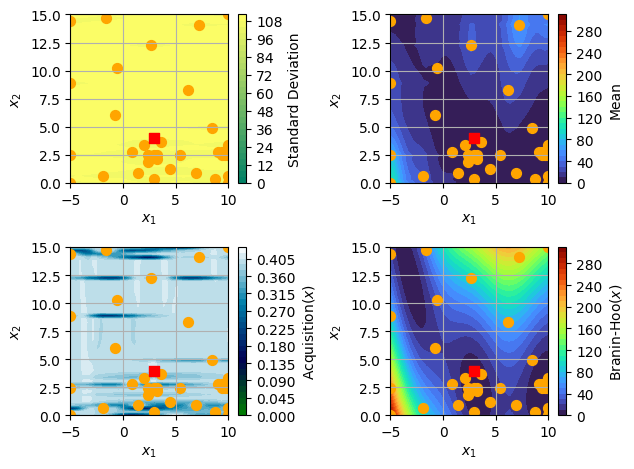

Current best value: 0.404492697787159
Next point to test: [2.95918367 3.97959184]
Value of next point:  2.9846797445400934


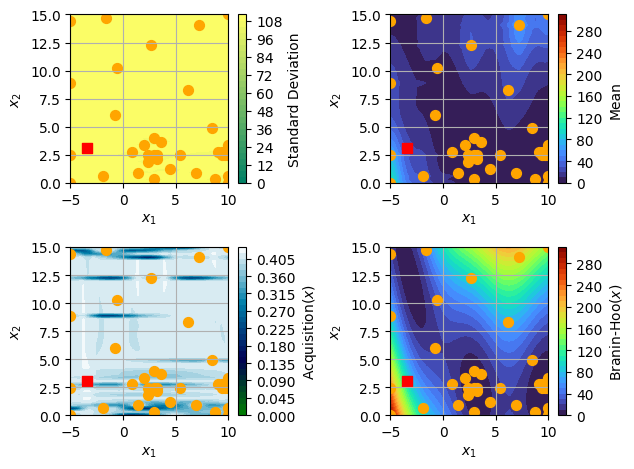

Current best value: 0.404492697787159
Next point to test: [-3.46938776  3.06122449]
Value of next point:  101.21792477509092


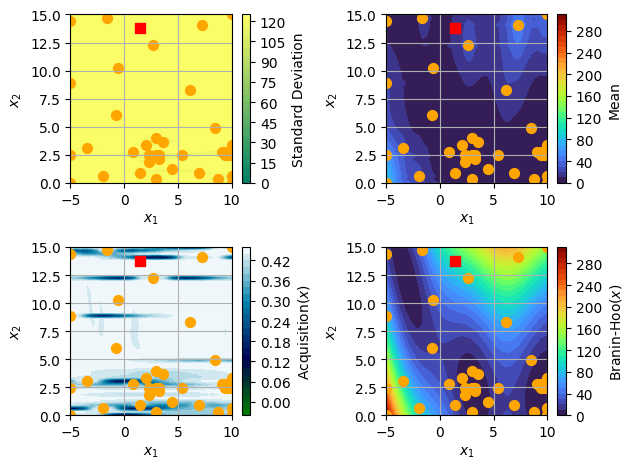

Current best value: 0.404492697787159
Next point to test: [ 1.42857143 13.7755102 ]
Value of next point:  107.11727372072173


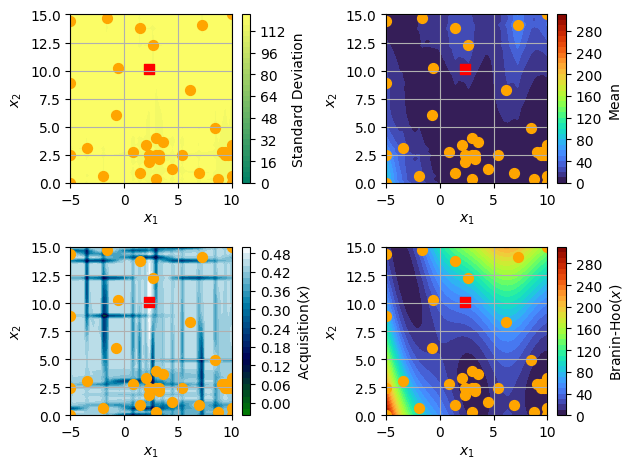

Current best value: 0.404492697787159
Next point to test: [ 2.34693878 10.10204082]
Value of next point:  54.0496693252664


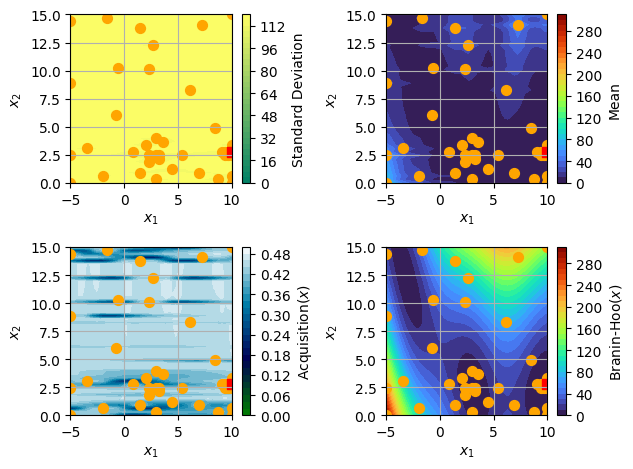

Current best value: 0.404492697787159
Next point to test: [10.          2.75510204]
Value of next point:  2.0045725479760064


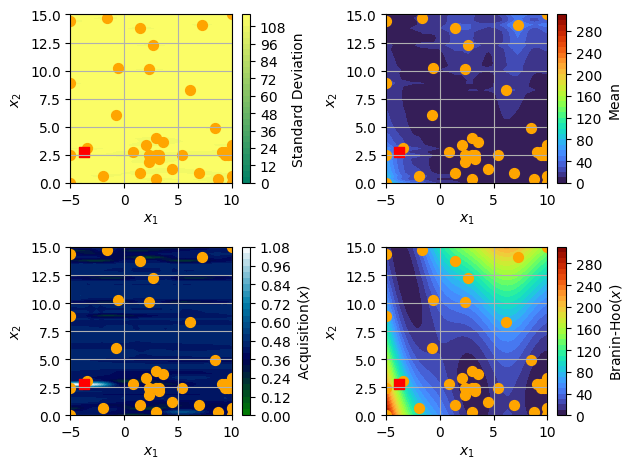

Current best value: 0.404492697787159
Next point to test: [-3.7755102   2.75510204]
Value of next point:  125.36839383708858


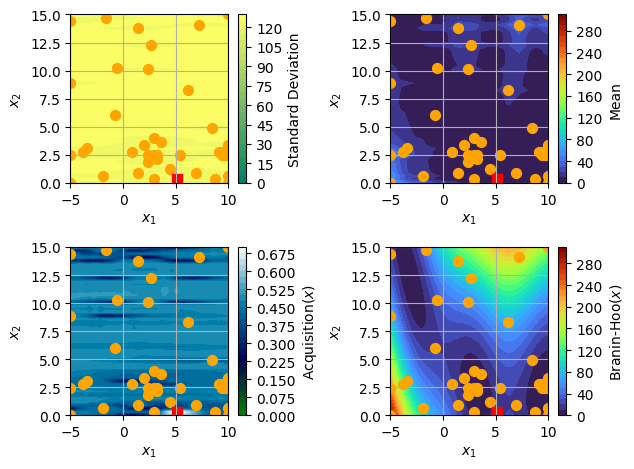

Current best value: 0.404492697787159
Next point to test: [5.10204082 0.30612245]
Value of next point:  14.524563482639142


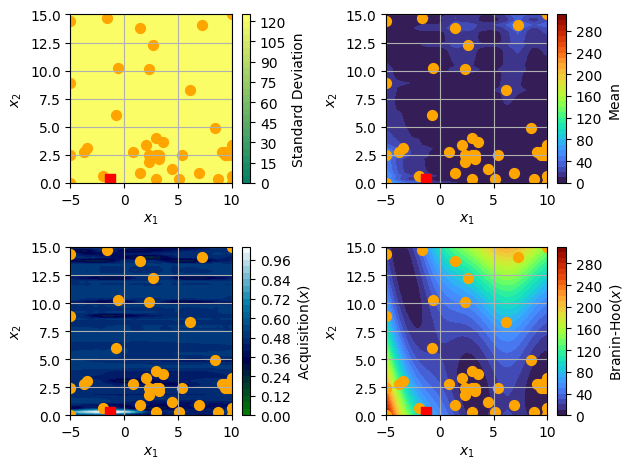

Current best value: 0.404492697787159
Next point to test: [-1.32653061  0.30612245]
Value of next point:  76.84231175611423


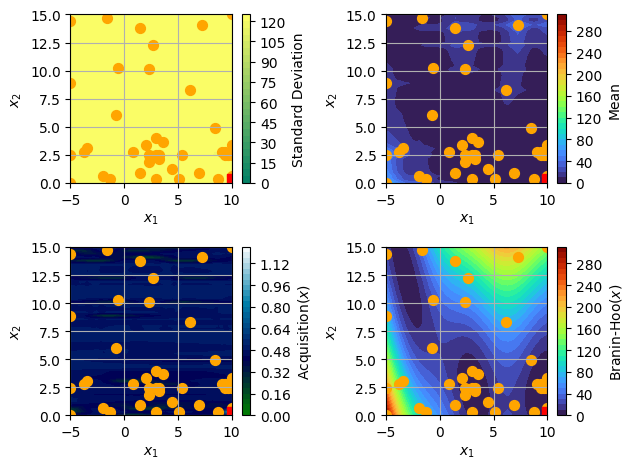

Current best value: 0.404492697787159
Next point to test: [10.          0.30612245]
Value of next point:  9.216055129089016


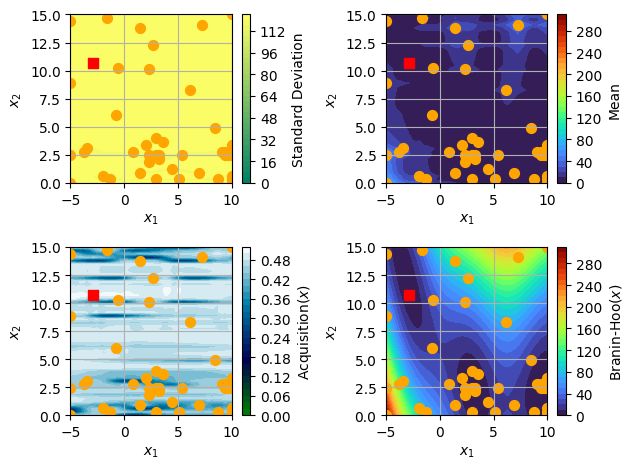

Current best value: 0.404492697787159
Next point to test: [-2.85714286 10.71428571]
Value of next point:  1.5715097615764382


In [19]:
fmin_RBF_EI=BayesianOPT(x_sample,y_sample,branin_hoo,space,kernel="RBF",acq="EI",n_gpr=n_gpr,n_iter=n_iter)

Plot the trajectory of how soon each method reaches the minimum value.

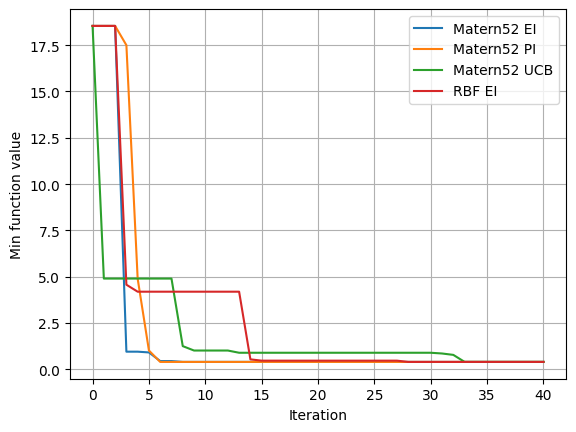

In [21]:
iteration=np.arange(0,n_iter+1)
plt.plot(iteration,fmin_Matern52_EI,label='Matern52 EI')
plt.plot(iteration,fmin_Matern52_PI,label='Matern52 PI')
plt.plot(iteration,fmin_Matern52_LCB,label='Matern52 UCB')
plt.plot(iteration,fmin_RBF_EI,label='RBF EI')
plt.legend(loc='upper right')
plt.xlabel('Iteration')
plt.ylabel('Min function value')
plt.grid()